In [4]:
import numpy as np
import matplotlib.pyplot as plt
import _pickle as pkl
import pandas as pd
import os,sys,glob, h5py

from dlab import generalephys as ephys
from dlab.generalephys import placeAxesOnGrid, cleanAxes
#from dlab import utils
from dlab import rf_analysis
from dlab import psth_and_raster as psth
from dlab import reliability_and_precision as rp
from dlab.continuous_traces import gaussian_filter1d
from scipy.signal import find_peaks
from scipy.stats import pearsonr, spearmanr, zscore
from itertools import combinations 

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import seaborn as sns
sns.set_style('white')
%matplotlib inline
%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings('ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# functions

In [2]:
def synchphys(software_start,frame_timestamps,samplerate = 30000):
#synch the ephys with the behavior to find reachmax timessoftware_start = 56549737/30000 #convert software start time in samples to seconds
    st = software_start/samplerate
    ts_sec = frame_timestamps/samplerate # convert frame timestamps to seconds
    ts_z = ts_sec - st #subtract software start from frames
    reachmax = np.array(df_reaches.reachMax)
    reachmax = reachmax[~np.isnan(reachmax)]
    reachmax = reachmax.astype('int')
    reach_times = ts_z[reachmax]
    return(reach_times)
  
    
def epochfr(df,df_reaches,start,end,binsize=0.020):
    ## if epoch is BEFORE reachmax (such as baseline) then end variable must be input as negative as per code (i.e. end = -0.5)
    
    byreach=np.zeros((len(df),1))
    maxfr_ind=np.zeros((len(df),1))
    peakfr_max=np.zeros((len(df),1))
    peakfr_min=np.zeros((len(df),1))
    rd = []
    frs = []
    tops = []
    frmaxs = []
    frmins = []
    
    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max
            #rd = np.array(t[(t >= tmax-start) & (t <= tmax+end)]) #find if that unit spiked within designated timeframes around reachmax
            rd = np.array(t[(t >= tmax+start) & (t <= tmax+end)]) #find if that unit spiked within designated timeframes around reachmax
            #edges=np.arange(tmax-start,tmax+end,binsize) #designated bins around specific iteration of reachmax
            edges=np.arange(tmax+start,tmax+end,binsize)
            hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
            top = np.argmax(hist)
            fr = sum(hist)/abs(end-start) # in Hz ######????????????
            frs.extend([fr])
            tops.extend([top])
            frmax = np.max(hist)/binsize
            frmin = np.min(hist)/binsize
            frmaxs.append(frmax)
            frmins.append(frmin)
        meanfr = np.mean(frs)
        tops_ave = np.mean(tops)
        maxs = np.mean(frmaxs)
        mins = np.mean(frmins)
        frs = []
        tops=[]
        frmaxs = []
        frmins = []
        maxfr_ind[i,:] = tops_ave
        byreach[i,:] = meanfr
        peakfr_max[i,:] = maxs
        peakfr_min[i,:] = mins
    return byreach, peakfr_max, peakfr_min


def epochfr_baseline(df,df_reaches,start,end,binsize=0.020):
    ## if epoch is BEFORE reachmax (such as baseline) then end variable must be input as negative as per code (i.e. end = -0.5)
    
    byreach=np.zeros((len(df),1))
    rd = []
    frs = []
    
    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max
            #rd = np.array(t[(t >= tmax-start) & (t <= tmax+end)]) #find if that unit spiked within designated timeframes around reachmax
            rd = np.array(t[(t >= tmax+start) & (t <= tmax+end)]) #find if that unit spiked within designated timeframes around reachmax
            #edges=np.arange(tmax-start,tmax+end,binsize) #designated bins around specific iteration of reachmax
            edges=np.arange(tmax+start,tmax+end,binsize)
            hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
            fr = sum(hist)/abs(end-start) ######????????????????????????????????????????? 
            frs.extend([fr])
        meanfr = np.mean(frs)
        frs = []
        byreach[i,:] = meanfr
    return byreach


def reachave_bins(df,df_reaches,start,end,binsize=0.020): #DO NOT USE
    #collapses mean fr along bins and normalizes
    #start and end variables are negative if before reachmax (i.e. baseline)
    asdfasdfasdf
    #initialize 
    ave_reach = []
    normedbins = []
    edges=np.arange(start,end,binsize)
    num_bins=edges.shape[0]-1 #number of bins 
    ave_reach_tens=np.zeros((len(df),num_bins)) #for tensor

    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max
            rd = np.array(t[(t >= tmax+start) & (t <= tmax+end)]) #find if that unit spiked within designated timeframes around reachmax
            edges=np.arange(tmax+start,tmax+end,binsize) #designated bins around this iteration of reachmax
            num_bins=edges.shape[0]-1 #number of bins 
            byreach=np.zeros((len(df_reaches.rMax_t),num_bins)) #initialize or empty byreach
            hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
            byreach[j,:] = hist
        meanbinfr = np.mean(byreach,axis=0)
        if sum(meanbinfr) > 0: 
            ave_reach.append(meanbinfr)
            ave_reach_tens[i,:] = meanbinfr #for tensor purposes (neural trajectories)
            normbins = (meanbinfr-min(meanbinfr))/max(meanbinfr) #per dailey
            normedbins.append(normbins)
    
    return ave_reach, normedbins, ave_reach_tens



def reachave_tensor(df,df_reaches,binsize=0.020, start = 4.0,end = 2.0):
    #START IS TIME BEFORE REACHMAX
    #END IS TIME AFTER REACHMAX -- IF BEFORE REACHMAX THEN END MUST BE NEGATIVE
    #collapses mean fr along bins
    #initialize 
    edges=np.arange(-start,end,binsize)
    num_bins=edges.shape[0]-1 #number of bins 
    byreach=np.zeros((len(df_reaches.rMax_t),num_bins))
    ave_reach_=np.zeros((len(df),num_bins)) #for tensor purposes
    ave_reach = []
    normedbins = []

    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max
            rd = np.array(t[(t >= tmax-start) & (t <= tmax+end)]) #find if that unit spiked within designated timeframes around reachmax
            edges=np.arange(tmax-start,tmax+end,binsize) #designated bins around this iteration of reachmax
            hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
            byreach[j,:] = hist
        meanbinfr = np.mean(byreach,axis=0)
        ave_reach.append(meanbinfr)
    
        ave_reach_[i,:] = meanbinfr #for tensor purposes (neural trajectories)
    
        if sum(meanbinfr)>0:
            normbins = (meanbinfr-min(meanbinfr))/max(meanbinfr) #per dailey
            normedbins.append(normbins)
            #seq.append(normedbins)
           # x = i #unit number
            #indix.append(x)
        else:
            normedbins.append(None)
    
        byreach=np.zeros((len(df_reaches.rMax_t),num_bins))

    return ave_reach, normedbins, ave_reach_



def countlist(lst): #to count consecutive numbers in movement-related code
    streak_count = []
    counter = 1
    for i in range(len(lst)):
        if i != (len(lst) - 1):
            diff = lst[i+1] - lst[i]
            if diff == 1:
                counter += 1
            else:
                streak_count.append(counter)
                counter = 1
        else:
            streak_count.append(counter)
    return(streak_count)



def movement_mod(df,df_reaches,startb,endb,starte,ende,binsize=0.001): #binsize 1 ms
    
    edgesb=np.arange(startb,endb,binsize)
    num_binsb=edgesb.shape[0]-1 #number of bins

    edgese=np.arange(starte,ende,binsize)
    num_binse=edgese.shape[0]-1 #number of bins

    byreach_b=np.zeros((len(df_reaches.rMax_t),num_binsb))
    byreach_e=np.zeros((len(df_reaches.rMax_t),num_binse))

    mod_up = []
    mod_down = []
    maxfr_ts = []
    minfr_ts = []
    maxfrs = []

    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
    
        for j,tmax in enumerate(df_reaches.rMax_t): 
        
            base = np.array(t[(t >= tmax+startb) & (t <= tmax+endb)])
            epoch = np.array(t[(t >= tmax+starte) & (t <= tmax+ende)])
        
            edgesb = np.arange(tmax+startb,tmax+endb,binsize)
            edgese = np.arange(tmax+starte,tmax+ende,binsize)
        
            histb=np.histogram(base,edgesb)[0] 
            histe=np.histogram(epoch,edgese)[0]
    
            byreach_b[j,:] = histb
            byreach_e[j,:] = histe
    
        meanbinfr_b = np.mean(byreach_b,axis=0)
        mfrb_ser = pd.Series(meanbinfr_b)        
        rolave_mfrb = mfrb_ser.rolling(100).sum() #takes sum of 100bins, shifts 1bin .. 100 bins binned at 1 ms = 100ms summed bins
        rolave_mfrb = np.array(rolave_mfrb.dropna())
        #lower,upper = sms.DescrStatsW(rolave_mfrb).tconfint_mean() #fix this
        upper = np.mean(rolave_mfrb) + (2.56*np.std(rolave_mfrb))
        lower = np.mean(rolave_mfrb) - (2.56*np.std(rolave_mfrb))

        meanbinfr_e = np.mean(byreach_e,axis=0)
        mfr_ser = pd.Series(meanbinfr_e)        
        rolave_mfr = mfr_ser.rolling(100).sum() #takes sum of 100bins, shifts 1bin
        maxfr = np.max(rolave_mfr)/.1
        maxfr_t = edgese[np.argmax(rolave_mfr)]-tmax
        minfr_t = edgese[np.argmin(rolave_mfr)]-tmax
        
        maxfrs.append(maxfr)
        maxfr_ts.append(maxfr_t)
        minfr_ts.append(minfr_t)

        mfr_a = np.array(rolave_mfr)
        up = np.where(mfr_a >= upper)[0].tolist()
        down = np.where(mfr_a <= lower)[0].tolist()

        consec_up = np.array(countlist(up))
        consec_down = np.array(countlist(down))

        if any(consec_up >= 50): #if there are 50 consecutive bins
            ups = 'yes'
            mod_up.append(ups)
        else:
            ups_ = 'no'
            mod_up.append(ups_)
    
        if any(consec_down >= 50): #if there are 50 consecutive bins
            downs = 'yes'
            mod_down.append(downs)
        else:
            downs_ = 'no'
            mod_down.append(downs_)

    return mod_up, mod_down, maxfr_ts, minfr_ts, maxfrs



#mean removes and normalizes to std
def center(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=True)
    Xc = ss.fit_transform(X.T).T
    return Xc



def pca(tens):
    for i in range(min(tens.shape[0], tens.shape[1])-1):
        pca = PCA(n_components=i)
        p=pca.fit_transform(tens.T).T
        ev = (pca.explained_variance_ / sum(pca.explained_variance_))
    return p,ev

In [3]:
# label reachmax

# smooth?

# look at sequence

def bytrial_heatmap(df,df_reaches,start,end,smooth=False,save=False,binsize = 0.020):
    
    edgest=np.arange(start,end,binsize)
    num_binst=(edgest.shape[0]) #number of bins 
    hmap=np.zeros((np.shape(df)[0],num_binst))
    #hmap_rollave=np.zeros((shape(df)[0],num_bins))
    byreach = []
    rollave = []
    maxfr_ts = []
    minfr_ts = []
    maxfrs = []
    normedbins = []
    normedbins_roll = []
    inds = []
    df_succ = df_reaches[df_reaches.behaviors=='success']
    
    for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max

        hmap=np.zeros((np.shape(df)[0],num_binst))
        byreach = []
        rollave = []
        maxfr_ts = []
        minfr_ts = []
        maxfrs = []
        normedbins = []
        smooths = []
        indices = []
        aveup = []
        avedown = []
        avesuccup = []
        avesuccdown = []

        a = tmax+start
        b = tmax+end

        trial_outcome = j, df_reaches.behaviors[j]

        for i,times in enumerate(df.times): #for each unit 
            t = np.array(times) #for reach unit create an array of that unit's spike times
            binsize = binsize
            rd = np.array(t[(t >= a) & (t <= b)]) #find if that unit spiked within designated timeframes around reachmax
            edges=np.arange(a,b,binsize) #designated bins around this iteration of reachmax
            num_bins=edges.shape[0]-1 #number of bins 
            hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
            #hmap[i,:] = hist
            if smooth==True:
                smoo = gaussian_filter1d(hist, sigma=0.5)
                smooths.append(smoo)
            byreach.append(hist)
            
            ave_max_t = df.peakup[i]
            aveup.append(ave_max_t)
            ave_min_t = df.peakdown[i]
            avedown.append(ave_min_t)
            
            #ave_max_t_s = df.peakup_s[i]
            #avesuccup.append(ave_max_t_s)
            #ave_min_t_s = df.peakdown_s[i]
            #avesuccdown.append(ave_min_t_s)

            if sum(hist)>0:
                normbins = (hist-min(hist))/max(hist) #per dailey
                normedbins.append(normbins)
            else:
                normedbins.append(None)
                
            
            binsize_ = 0.001
            edges_=np.arange(a,b,binsize_) #designated bins around this iteration of reachmax
            num_bins_=edges_.shape[0]-1 #number of bins 
            unit=np.histogram(rd,edges_)[0] #bin spikes into timeframe
            unit_ser = pd.Series(unit)        
            rolave_unit = unit_ser.rolling(100).sum() #takes sum of 100bins, shifts 1bin .. 100 bins binned at 1 ms = 100ms summed bins
            rolave_unit = np.array(rolave_unit.dropna())
            maxfr = np.max(rolave_unit)/.1
            maxfr_t = edges_[np.argmax(rolave_unit)]-tmax
            minfr_t = edges_[np.argmin(rolave_unit)]-tmax
            #hmap_rollave[i,:] = unit
            rollave.append(unit)
            maxfrs.append(maxfr)
            maxfr_ts.append(maxfr_t)
            minfr_ts.append(minfr_t)
        
        inds.append(indices)

        df_temp = pd.DataFrame(data=minfr_ts,columns=['tmin'])
        if smooth==False:
            df_temp['bins'] = normedbins
        if smooth==True:
            df_temp['bins'] = smooths
        df_temp['tmax'] = maxfr_ts
        df_temp['aveup'] = aveup
        df_temp['avedown'] = avedown
        #df_temp['aveup_s'] = avesuccup
        #df_temp['avedown_s'] = avesuccdown
        
#create temp dataframe and sort values by max, plot heatmap
        df_s_ = df_temp.sort_values(by=['tmax'])
        df_bins_ = df_s_.bins
        df_heatmap_ = list(filter(any, df_bins_))
        fig, ax = plt.subplots(figsize=(20, 10))
        sns.heatmap(df_heatmap_)
        plt.title(trial_outcome)
        plt.gca().axvline(150,c='b',ls='-')
        plt.show()
        if save==True:
            save_path1 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
            fig.savefig(save_path1+str(trial_outcome)+'peak'+'.png')
        plt.close()
        
#create temp dataframe and sort values by min, plot heatmap
#        df_s_ = df_temp.sort_values(by=['tmin'])
#        df_bins = df_s_.bins
#        df_heatmap = list(filter(any, df_bins))
#        fig, ax = plt.subplots(figsize=(20, 10))
#        sns.heatmap(df_heatmap)
#        plt.title(trial_outcome)
#        plt.gca().axvline(150,c='b',ls='-')
#        if save==True:
#            save_path1 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/individualtrial/'
#            fig.savefig(save_path1+str(trial_outcome)+'min'+'.png')
 #       plt.close()
        
#create temp dataframe and sort values by average max bin, plot heatmap
#        df_s_ = df_temp.sort_values(by=['aveup'])
#        df_bins_ = df_s_.bins
#        df_heatmap_ = list(filter(any, df_bins_))
#        fig, ax = plt.subplots(figsize=(20, 10))
#        sns.heatmap(df_heatmap_)
#        plt.title(trial_outcome)
#        plt.gca().axvline(300,c='b',ls='-')
        #if save==True:
            #save_path2 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/averaged/'
            #fig.savefig(save_path2+str(trial_outcome)+'peak_'+'.png')
#        plt.close()
                
#create temp dataframe and sort values by average min bin, plot heatmap
#        df_s_ = df_temp.sort_values(by=['avedown'])
#        df_bins_ = df_s_.bins
#        df_heatmap_ = list(filter(any, df_bins))
#        fig, ax = plt.subplots(figsize=(20, 10))
#        sns.heatmap(df_heatmap_)
#        plt.title(trial_outcome)
#        plt.gca().axvline(150,c='b',ls='-')
#        if save==True:
#            save_path2 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/averaged/'
#            fig.savefig(save_path2+str(trial_outcome)+'min_'+'.png')
        
        
#create temp dataframe and sort values by average SUCCESS min bin, plot heatmap
#        df_s_ = df_temp.sort_values(by=['aveup_s'])
#        df_bins_ = df_s_.bins
#        df_heatmap_ = list(filter(any, df_bins_))
#        fig, ax = plt.subplots(figsize=(20, 10))
#        sns.heatmap(df_heatmap_)
#        plt.title(trial_outcome)
#        plt.gca().axvline(300,c='b',ls='-')
        #if save==True:
            #save_path3 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/success_averaged/'
            #fig.savefig(save_path3+str(trial_outcome)+'peak_s'+'.png')
#        plt.close()
        
        
        #create temp dataframe and sort values by average SUCCESS min bin, plot heatmap
#        df_s_ = df_temp.sort_values(by=['avedown_s'])
#        df_bins_ = df_s_.bins
#        df_heatmap_ = list(filter(any, df_bins_))
#        fig, ax = plt.subplots(figsize=(20, 10))
#        sns.heatmap(df_heatmap_)
#        plt.title(trial_outcome)
#        plt.gca().axvline(150,c='b',ls='-')
#       if save==True:
#            save_path3 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/success_averaged/'
#            fig.savefig(save_path3+str(trial_outcome)+'min_s'+'.png')
    
    return inds
        
        
        
        
#for GPFA, get neurons binned for each trial
def get_trials(df,df_reaches,start,end,binsize):

    edges=np.arange(start,end,binsize)
    num_bins=edges.shape[0] #number of bins 
    byreach=np.zeros((np.shape(df)[0],num_bins))
    alltrials = []
    trajs = []
    evs = []
    outcomes = []

    for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max
        a = tmax+start
        b = tmax+end
        byreach=np.zeros((np.shape(df)[0],num_bins))
        for i,times in enumerate(df.times): #for each unit 
            t = np.array(times) #for reach unit create an array of that unit's spike times
            try:
                rd = np.array(t[(t >= a) & (t <= b)]) #find if that unit spiked within designated timeframes around reachmax
                edges=np.arange(a,b,binsize) #designated bins around this iteration of reachmax
                num_bins=edges.shape[0]-1 #number of bins 
                hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
                byreach[i,:] = hist
            except:
                []

        alltrials.append(byreach)
        
    return alltrials


def pca_singletrial(df,df_reaches,start,end,binsize):

    edges=np.arange(start,end,binsize)
    num_bins=edges.shape[0] #number of bins 
    byreach=np.zeros((shape(df)[0],num_bins))
    alltrials = []
    trajs = []
    evs = []
    outcomes = []

    for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max
        a = tmax+start
        b = tmax+end
        byreach=np.zeros((shape(df)[0],num_bins))
        for i,times in enumerate(df.times): #for each unit 
            t = np.array(times) #for reach unit create an array of that unit's spike times
            try:
                rd = np.array(t[(t >= a) & (t <= b)]) #find if that unit spiked within designated timeframes around reachmax
                edges=np.arange(a,b,binsize) #designated bins around this iteration of reachmax
                num_bins=edges.shape[0]-1 #number of bins 
                hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
                byreach[i,:] = hist
            except:
                []
        alltrials.append(byreach)

        center_traj = center(byreach)
        traj,ev = pca(center_traj)
        traj = gaussian_filter1d(traj, sigma=8)
        trajs.append(traj)
        evs.append(ev)
        
    return trajs,evs


def get_sequence(df,df_reaches,start,end,binsize):

    start = -0.5
    end = 0.50
    binsize=0.020

    edgest=np.arange(start,end,0.020)
    num_binst=(edgest.shape[0]) #number of bins 
    hmap=np.zeros((shape(df)[0],num_binst))
    byreach = []
    rollave = []
    maxfr_ts = []
    minfr_ts = []
    maxfrs = []
    normedbins = []
    normedbins_roll = []
    inds = []
    ts = []

    for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max

        byreach = []
        maxfr_ts = []
        minfr_ts = []
        maxfrs = []
        normedbins = []
        indix = []
        mxs = []
        types = []
        cls = []

        a = tmax+start
        b = tmax+end
        behav = df_reaches.behaviors[j]

        for i,times in enumerate(df.times): #for each unit 
            t = np.array(times) #for reach unit create an array of that unit's spike times
            binsize = 0.020
            rd = np.array(t[(t >= a) & (t <= b)]) #find if that unit spiked within designated timeframes around reachmax
            edges=np.arange(a,b,binsize) #designated bins around this iteration of reachmax
            num_bins=edges.shape[0]-1 #number of bins 
            hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
            byreach.append(hist)
            i = df.index[i]
            tp = df.waveform_class[i]
            types.append(tp)

            if sum(hist)>0:
                normbins = (hist-min(hist))/max(hist) #per dailey
                normedbins.append(normbins)
                #seq.append(normedbins)
               # x = i #unit number
                #indix.append(x)
            else:
                normedbins.append(None)

            binsize_ = 0.001
            edges_=np.arange(a,b,binsize_) #designated bins around this iteration of reachmax
            num_bins_=edges_.shape[0]-1 #number of bins 
            unit=np.histogram(rd,edges_)[0] #bin spikes into timeframe
            unit_ser = pd.Series(unit)        
            rolave_unit = unit_ser.rolling(100).sum() #takes sum of 100bins, shifts 1bin .. 100 bins binned at 1 ms = 100ms summed bins
            rolave_unit = np.array(rolave_unit.dropna())
            maxfr = np.max(rolave_unit)/.1
            maxfr_t = edges_[np.argmax(rolave_unit)]-tmax
            minfr_t = edges_[np.argmin(rolave_unit)]-tmax
            #hmap_rollave[i,:] = unit
            rollave.append(unit)
            maxfrs.append(maxfr)
            maxfr_ts.append(maxfr_t)
            minfr_ts.append(minfr_t)

        df_temp = pd.DataFrame(data=minfr_ts,columns=['tmin'])
        df_temp['bins'] = normedbins
        df_temp['tmax'] = maxfr_ts
        df_temp['unit_class'] = types

        df_s = df_temp.sort_values(by=['tmax'])

        for n,gr in enumerate(df_s.bins):
            if gr is not None:
                x = df_s.index[n]
                indix.append(x)
                mx = df_s.tmax[x]
                mxs.append(mx)
                cl = df_temp.unit_class[x]
                cls.append(cl)
            else:
                []
        inds.append(indix)

        dff = np.diff(mxs)

        count = arange(shape(indix)[0],0,-1)
        df_ind = pd.DataFrame(data=count,columns=['count'])
        df_ind['unit'] = indix
        df_ind['tmax'] = mxs
        df_ind['unit_class'] = cls
        fig, ax = plt.subplots(figsize=(20, 10))
        plt.title(behav)
        sns.scatterplot(x='tmax',y='count',data=df_ind,hue='unit',style='unit_class',legend=True)
        plt.gca().axvline(0,c='y',ls='-')

        plt.show()
        plt.close()
        #if save==True:
            #save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
        #else:
            #[]
        #fig.savefig(save_path+str(j)+str(behav))
    return indix

# load files

In [5]:
#only need to load this once when you're running data
#load processor start times
p_start = r'/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/finalized/Neuropixels_ProcessorStartTimes.csv'
df_start = pd.read_csv(p_start)
#df_start

In [6]:
#load dataframe from sorted data
data_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/dfs/dfexcept28_ypos.json'
df = pd.read_json(data_path)

In [7]:
#load TTL frame timestamps
ts_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/finalized/Video TTL Files/18_timestamps.npy'
#ts = np.loadtxt(ts_path) #if .txt
ts =np.load(ts_path) #if .npy



In [1]:
#import curated behavior for specific mouse (save .xls as .csv)
reach_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/finalized/Curated_Video_Timestamps/20200214_unit00_session002_NPCB_018_S2.csv'
#reach_path ='/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/finalized/Curated_Video_Timestamps/20200304_unit00_session002_NPCD_020_S1.csv'
df_reaches = pd.read_csv(reach_path)

NameError: name 'pd' is not defined

# run pipeline code

In [9]:
#change mouse number you want to analyze
mouse = 18

In [10]:
df=df[df.mouse==mouse] #isolates mouse from dataframe to analyze
df=df.reset_index()
df=df.drop('index',axis=1)

In [11]:
np.shape(ts) #number of timestamps


(972236,)

In [12]:
#adjust timestamps if necessary

ts_lst = ts.tolist()
del ts_lst[1::2] #remove odd indices
ts = np.array(ts_lst)

In [13]:
#remove irrelevant behaviors and nans
df_reaches = df_reaches.dropna(axis = 1 , how = 'all')
df_reaches = df_reaches.dropna(axis = 0 , how = 'all')
df_reaches = df_reaches[df_reaches.behaviors!='none'][df_reaches.behaviors!='arm_movement']


In [14]:
#synch ephys with behavior
sst = np.int(df_start[df_start.Mouse_number==mouse].Proccessor_Start_time)
reach_times = synchphys(sst,ts)
print(sst)


44373085


In [15]:
df_reaches['rMax_t']= reach_times #create new column of reach dataframe with reach times in seconds to compare to spike times
df_reaches = df_reaches.reset_index()

In [16]:
df_reaches

,index,reachInit,reachMax,reachEnd,stim,end_category,behaviors,rMax_t
0,0,47840,47866,47946,0,noPellet,retrieval_fail,322.847467
1,1,49976,50001,50052,0,noPellet,retrieval_fail,337.082233
2,2,52909,52935,53002,0,noPellet,grasp_fail,356.644167
3,3,82485,82525,82532,0,noPellet,grasp_fail,553.930667
4,4,84353,84374,84400,0,noPellet,grasp_fail,566.258567
5,5,93312,93325,93334,0,noPellet,grasp_fail,625.770900
6,6,101711,101730,101740,0,noPellet,grasp_fail,681.809867
7,7,110153,110186,110261,0,noPellet,success,738.188867
8,8,112616,112641,112698,0,noPellet,grasp_fail,754.557167
9,9,124717,124738,124757,0,noPellet,grasp_fail,835.211933


In [12]:
mod_up, mod_down, maxfr_ts, minfr_ts, a = movement_mod(df,df_reaches,startb = -1.0,endb = -0.5,starte = -0.5,ende = 0.5,binsize=0.001)
df['mod_up'] = mod_up
df['mod_down'] = mod_down
df['peakup'] = maxfr_ts
df['peakdown'] = minfr_ts

In [27]:
dfr_succ = df_reaches[df_reaches.behaviors=='success']

In [11]:
mod_up, mod_down, maxfr_ts, minfr_ts, a = movement_mod(df,dfr_succ,startb = -1.0,endb = -0.5,starte = -0.5,ende = 0.5,binsize=0.001)
df['mod_up_s'] = mod_up
df['mod_down_s'] = mod_down
df['peakup_s'] = maxfr_ts
df['peakdown_s'] = minfr_ts

NameError: name 'dfr_succ' is not defined

# determine laminar location for each unit

In [22]:
m = max(df.ypos)-500
df_23 = df[df.ypos>m]
df_5 = df[df.ypos<m]
df_23['lam'] = 'L2-3'
df_5['lam'] = 'L5'
df = pd.concat([df_23,df_5])

# plot stuff

In [132]:
for i in df_reaches.index:
    a = df_reaches.reachInit[i+1] 
    a = a * 0.0083 #frame rate of camera, convert to seconds
    b = df_reaches.reachInit[i]
    b = b * 0.0083
    c = a - b
    print(i,c)

0 17.72879999999998
1 24.34390000000002
2 245.4808
3 15.504400000000032
4 74.35969999999998
5 69.71170000000006
6 70.06859999999995
7 20.44290000000001
8 100.43830000000003
9 74.69170000000008
10 71.82819999999992
11 248.3110999999999
12 15.5625
13 26.70939999999996
14 134.26080000000002
15 63.07170000000019
16 248.27789999999982
17 110.61410000000001
18 6.955400000000054
19 267.13549999999987
20 108.09090000000015
21 25.813000000000102
22 155.2431999999999
23 143.53189999999995
24 14.923400000000129
25 -1695.7398
26 23.215099999999893
27 1386.6478


KeyError: 29

In [133]:
for i in df_reaches.index:
    a = df_reaches.reachEnd[i] 
    a = a * 0.0083 #frame rate of camera, convert to seconds
    b = df_reaches.reachInit[i]
    b = b * 0.0083
    c = a - b
    print(i,c)

0 0.8797999999999888
1 0.630800000000022
2 0.7719000000000165
3 0.39010000000007494
4 0.39009999999996126
5 0.18259999999997945
6 0.24069999999994707
7 0.8963999999999714
8 0.6806000000000267
9 0.33199999999987995
10 0.713799999999992
11 0.31539999999995416
12 0.5229000000001633
13 0.6059000000000196
14 0.39010000000007494
15 0.5644000000002052
16 1.0208999999999833
17 0.9545000000000528
18 0.904700000000048
19 0.7220999999999549
20 0.8466000000003078
21 1.9007000000001426
22 1.103900000000067
23 0.33199999999987995
24 0.39840000000003783
25 0.5560999999997875
26 1.0789999999999509
27 0.6640000000002146
28 1.4110000000000582


In [ ]:
#change average bin to the correct time frame [-2:2] or something
#change template average to just successes?
#compare to control animal

In [4]:
df = pd.read_json(r'C:\Users\Kim\Documents\Data\sorted_dfs\df_8_top20.json')

In [5]:
df_reaches = pd.read_json(r'C:\Users\Kim\Documents\Data\behavior\df_reaches_CFA8.json')

# Single trial heatmaps by cluster group

In [320]:
df = df
df_ = df[df.labels_pcs==2]
df_ = df_.reset_index()
df_ = df_.drop('index',axis=1)

In [18]:
df_reaches = df_reaches.reset_index()

In [5]:
dfg = pd.read_json(r'C:\Users\Kim\Documents\Data\gustavo_data\df_DG.json')
#dfg = dfg[dfg.cohort2=='Gustavo'][dfg.timepoint==2]
#dfd = dfg[dfg.timepoint==2][dfg.cohort2=='Dailey'][dfg.group=='good']
df1 = dfg[dfg.group=='good'][dfg.cohort2=='Dailey']
dfr1 = pd.read_json(r'Z:\BIOElectricsLab\Kim\DATAforanalysis\Dailey\df_reaches_061622.json')
#dfrg = pd.read_json(r'C:\Users\Kim\Documents\Data\gustavo_data\pipeline_inputs\df_reaches_MOBP_timepoint2.json')

In [14]:
from dlab import analysis_pipeline as analysis


In [15]:
df_align_all = [analysis.movement_mod(df1[df1.mouse==mouseid],dfr1[dfr1.mouse==mouseid]) for mouseid in dfr1.mouse.unique()]
df1 = pd.concat(df_align_all,ignore_index=True)

[11]
[12]
[20]
[22]
[24]
[]
[42]
[43]
[49]
[51]
[53]
[56]
[58]
[59]
[64]
[65]
[66]
[67]
[68]
[69]
[71]


In [21]:
df = df1[df1.mouse==67][df1.epochFR>1].reset_index()
dfr = dfr1[dfr1.mouse==67].reset_index()

In [22]:
bytrial_heatmap(df,dfr,-1,1,binsize = 0.020)

TypeError: 'NoneType' object is not iterable

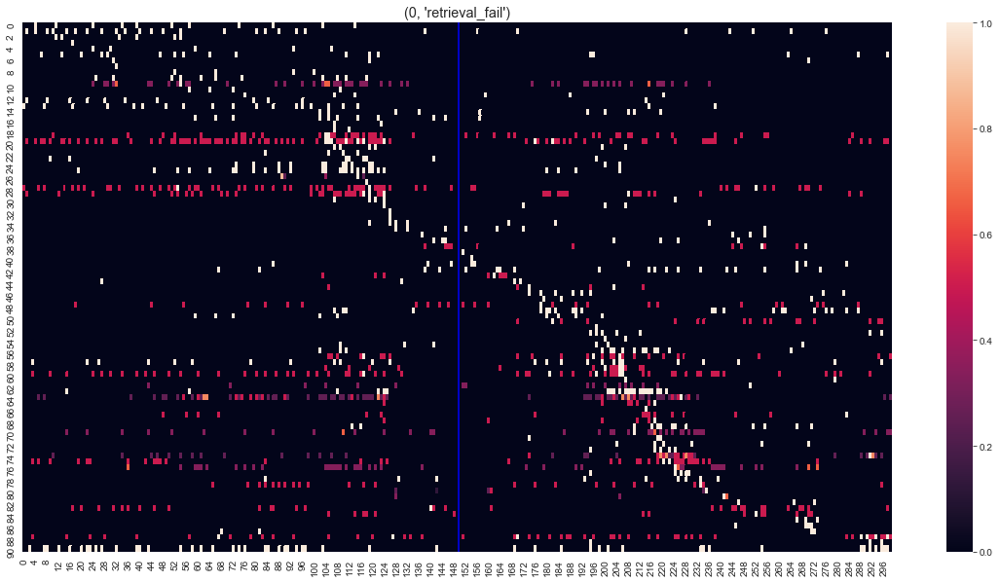

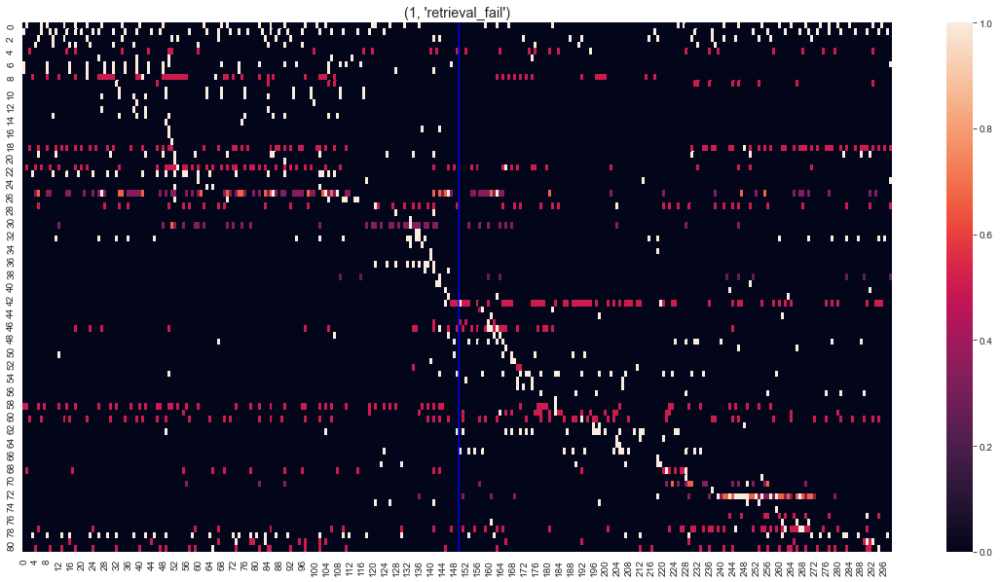

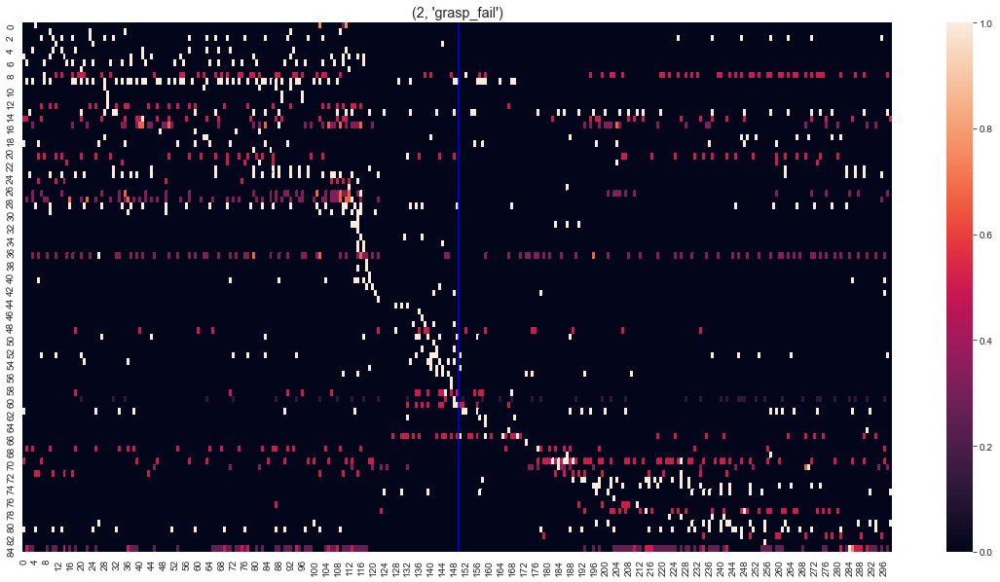

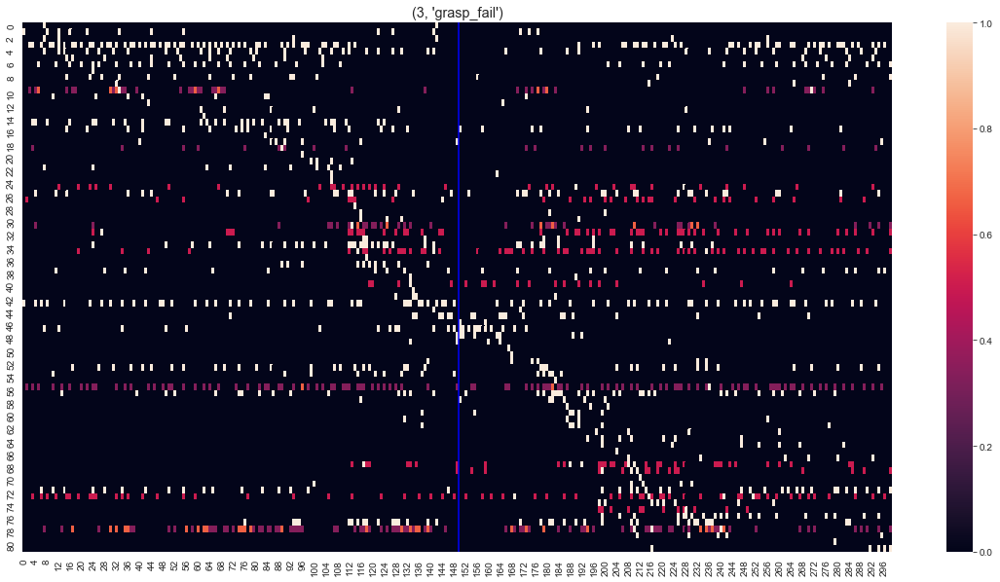

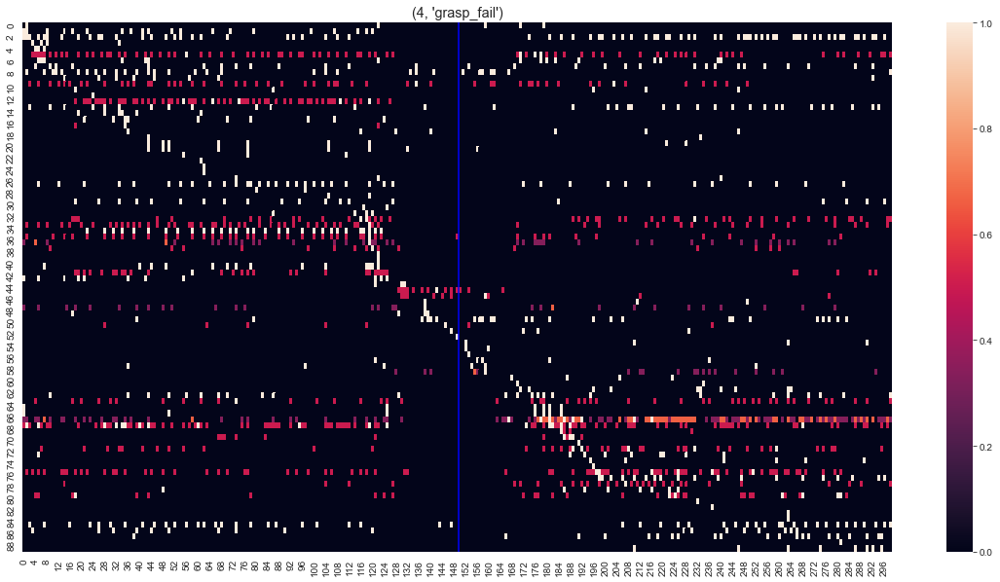

...

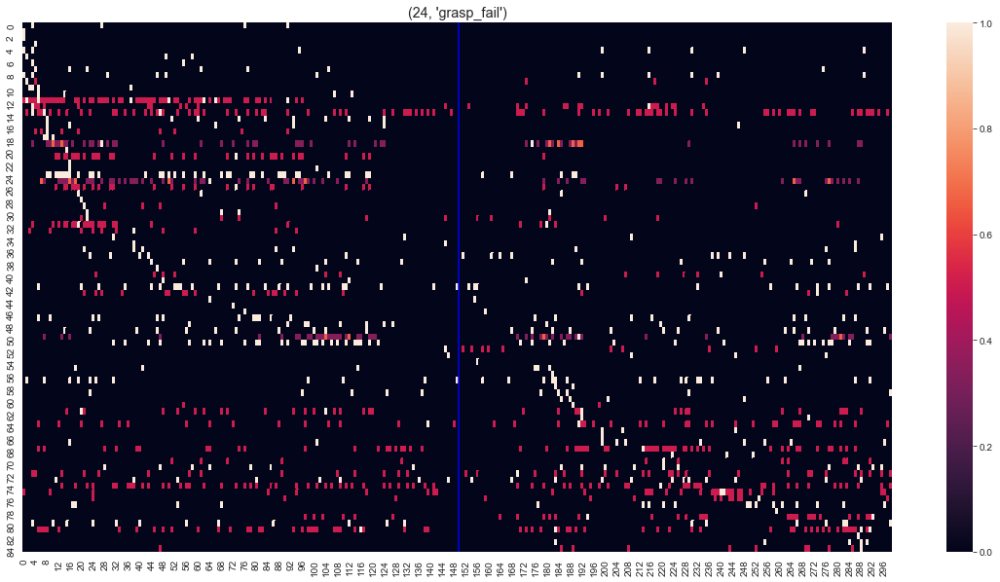

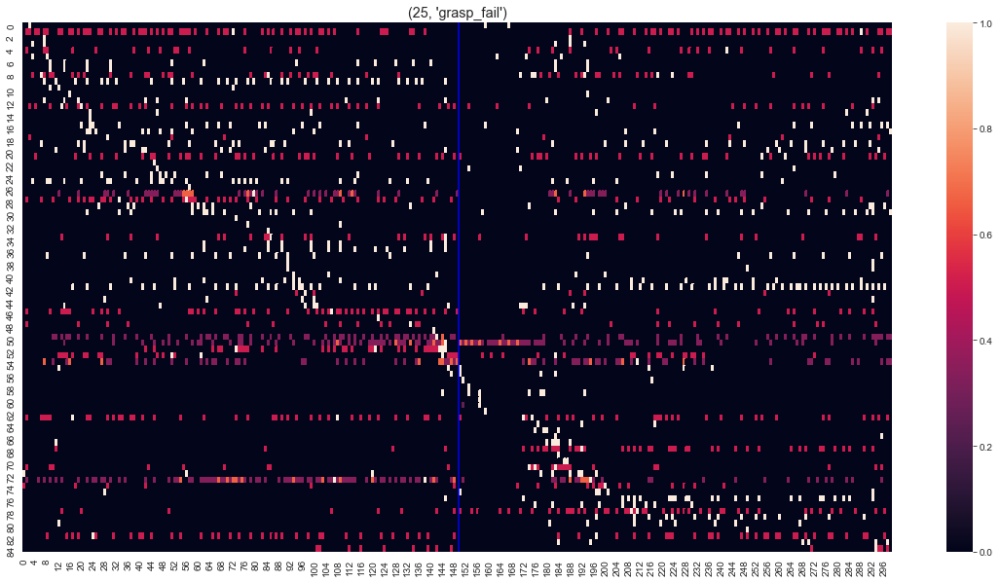

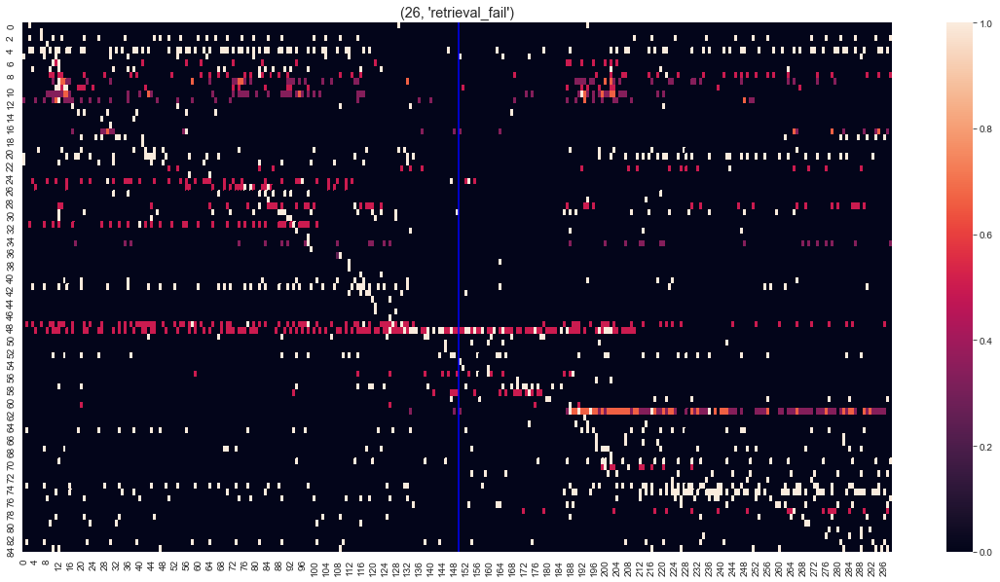

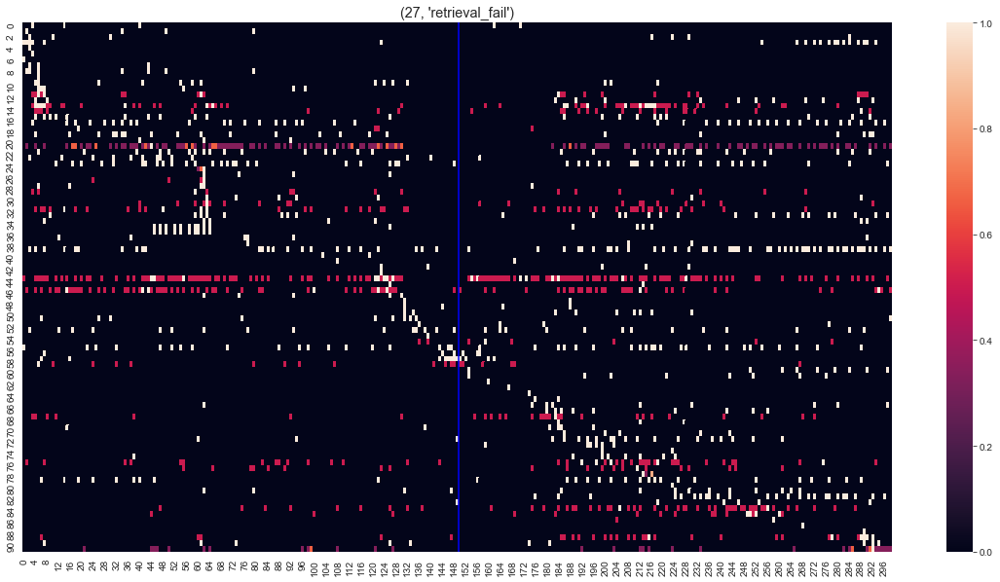

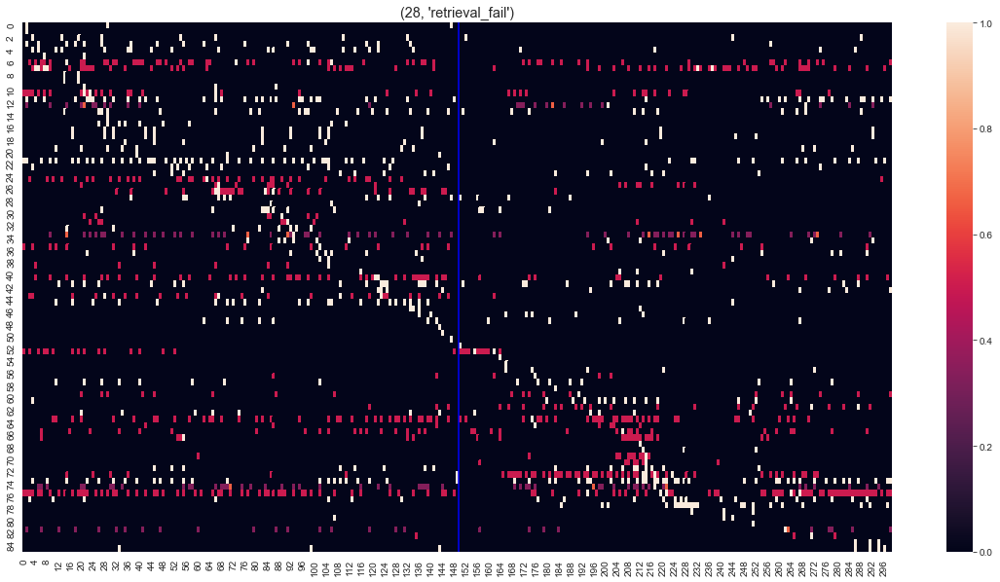

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

In [319]:
bytrial_heatmap(df_,df_reaches,-3,3,binsize = 0.020)

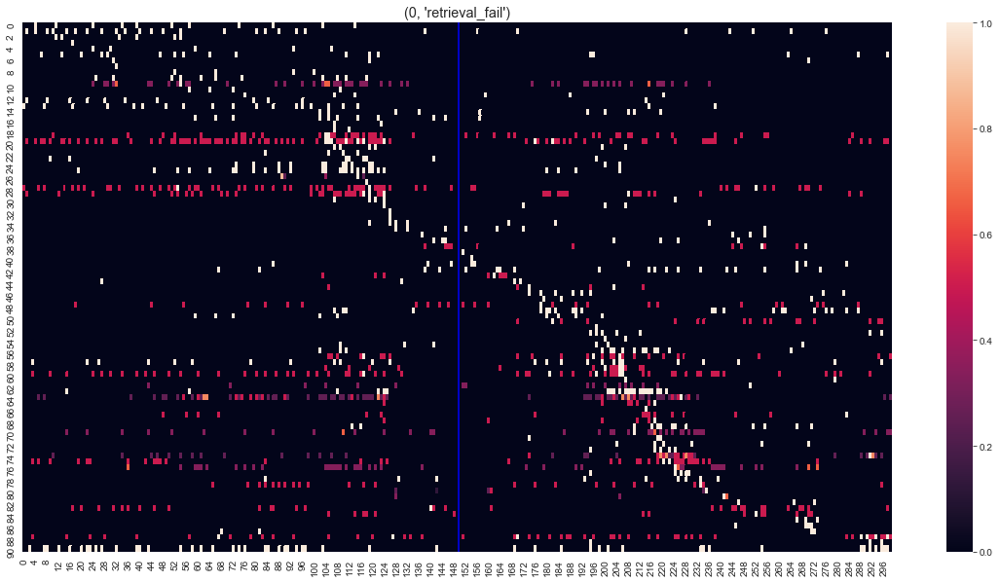

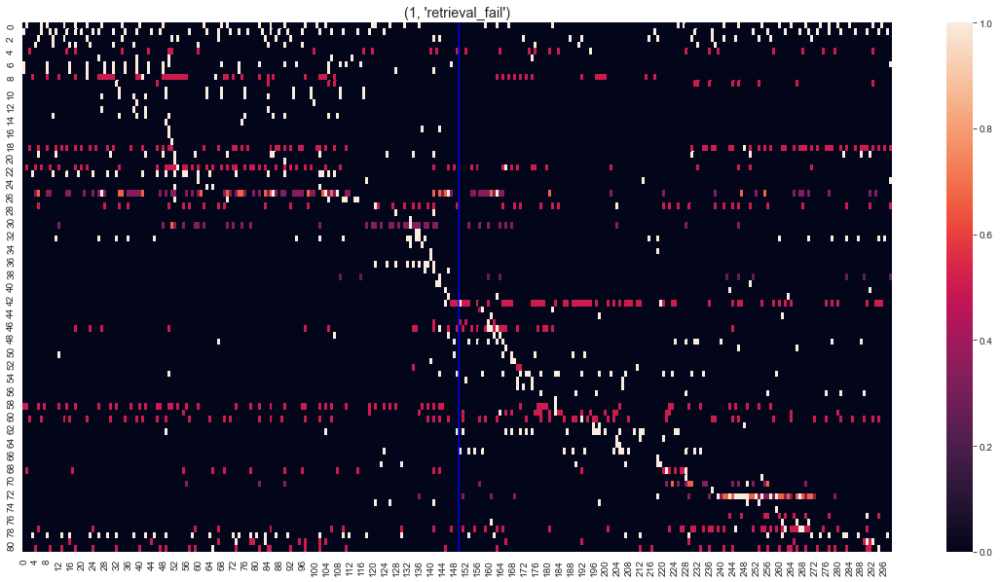

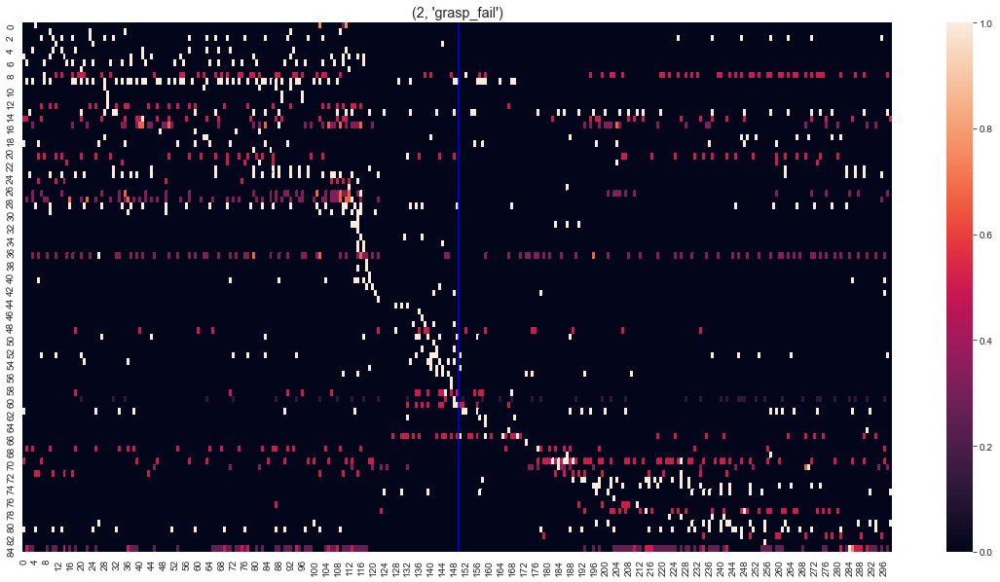

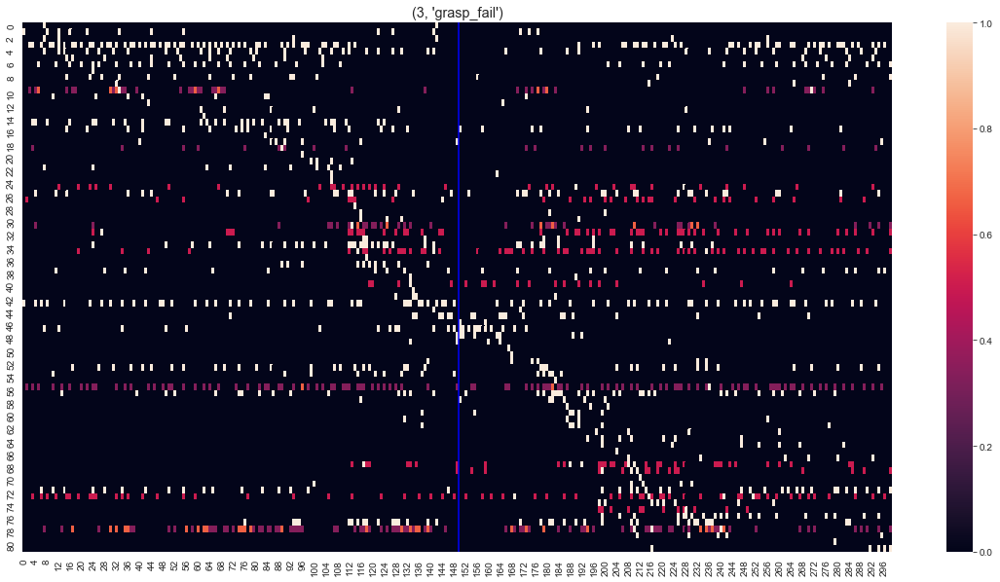

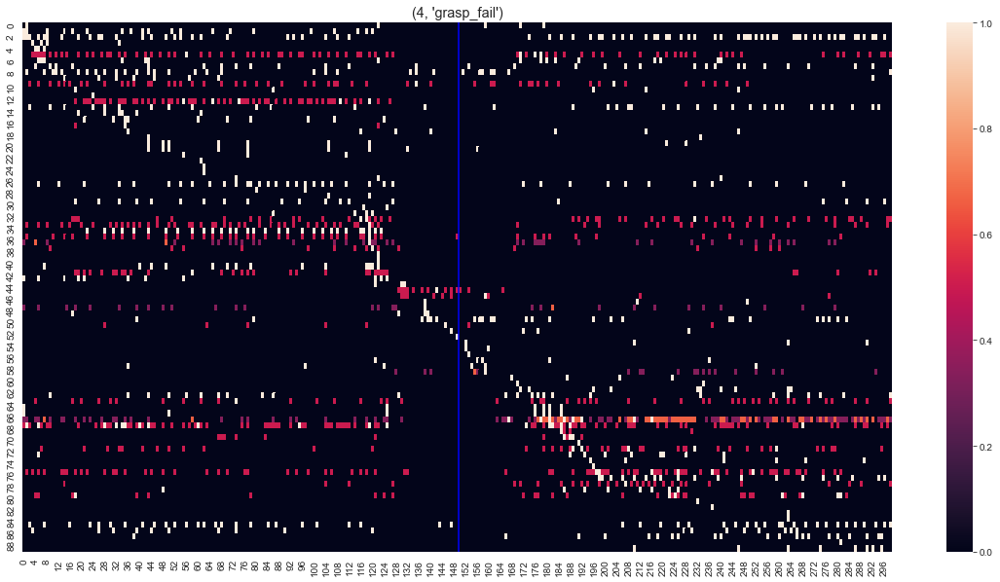

...

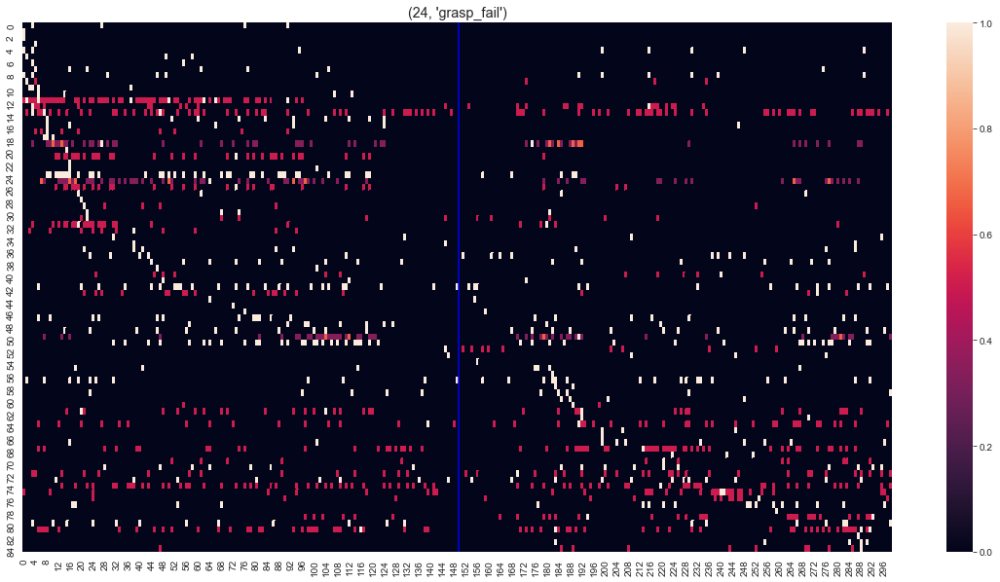

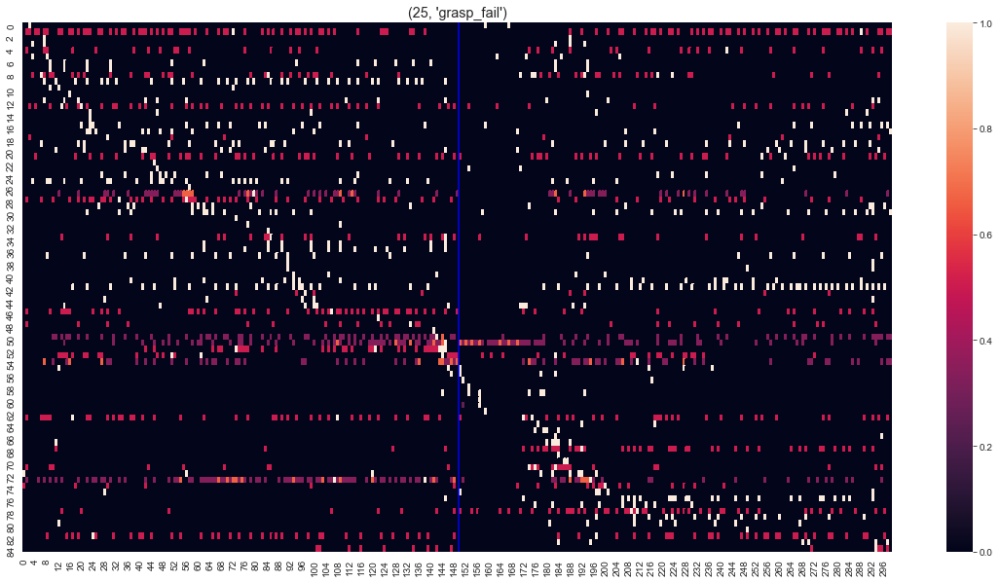

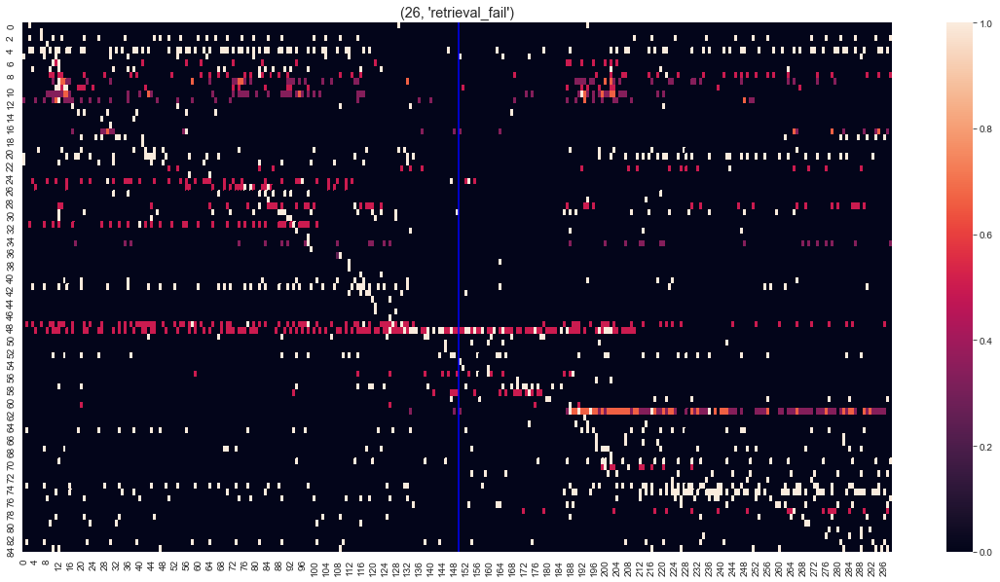

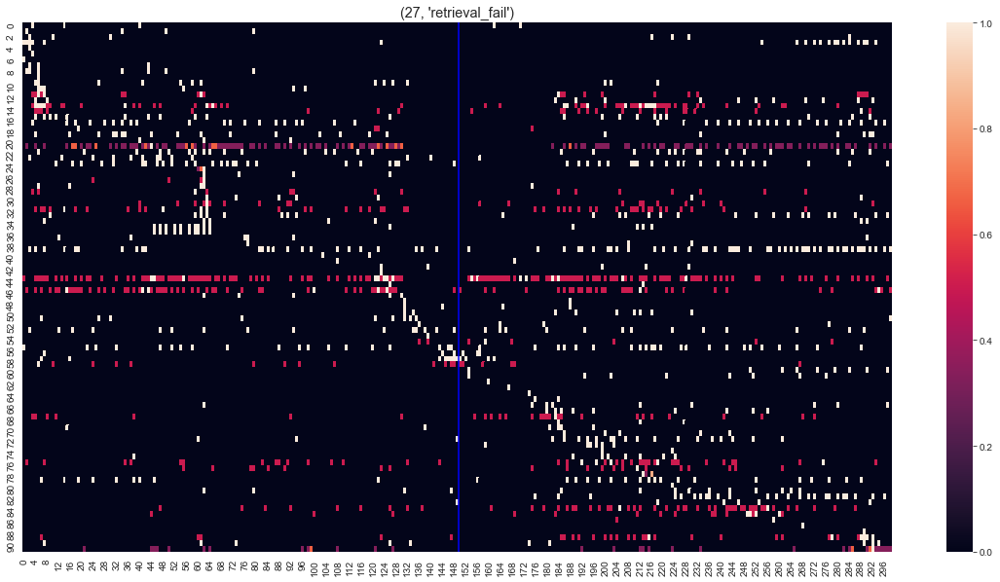

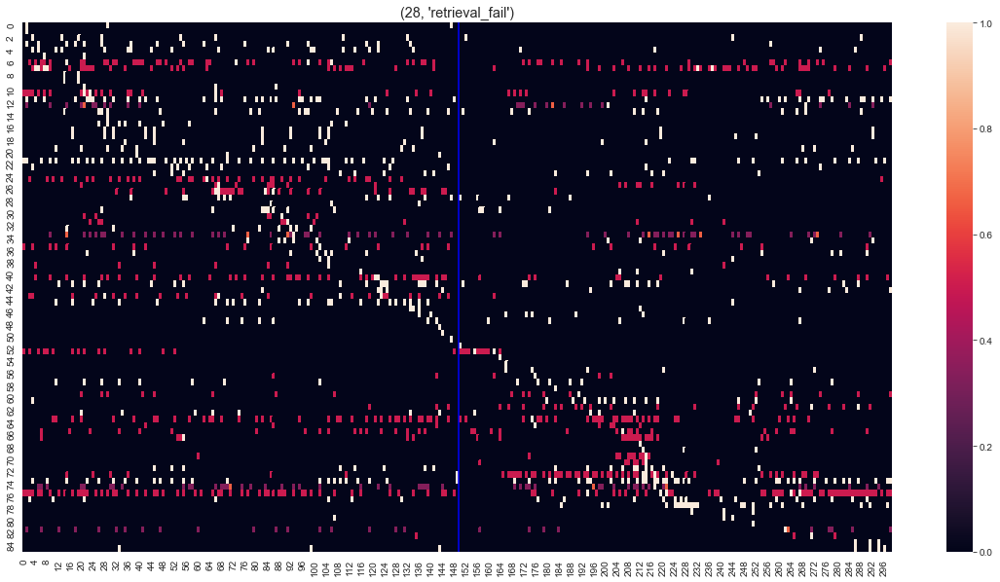

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

In [315]:
bytrial_heatmap(df_,df_reaches,-3,3,binsize = 0.020)

# Single trial heatmaps by waveform class

In [354]:
df_wc = df[df.waveform_class == 'fs']
df_wc = df_wc.reset_index()
df_wc = df_wc.drop('index',axis=1)

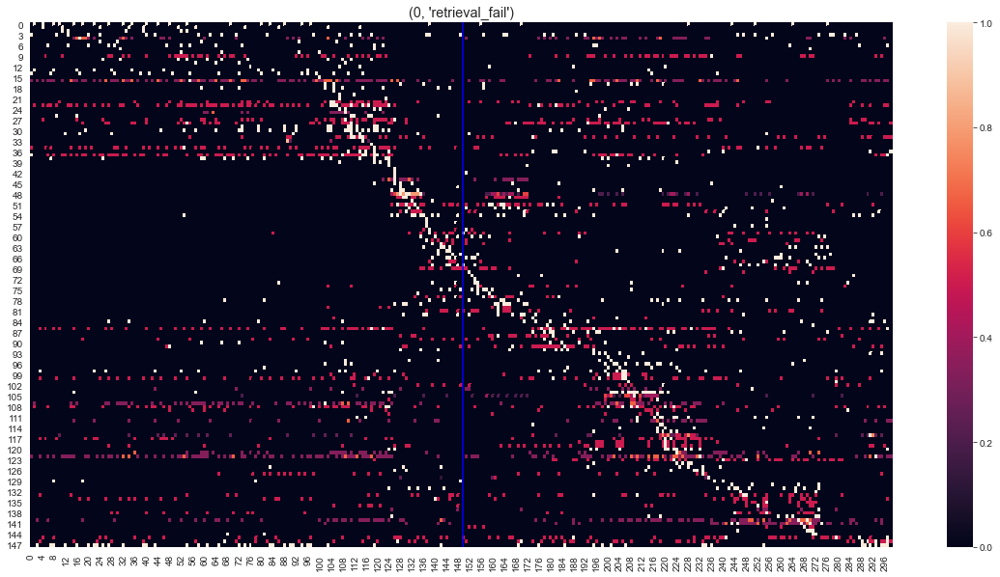

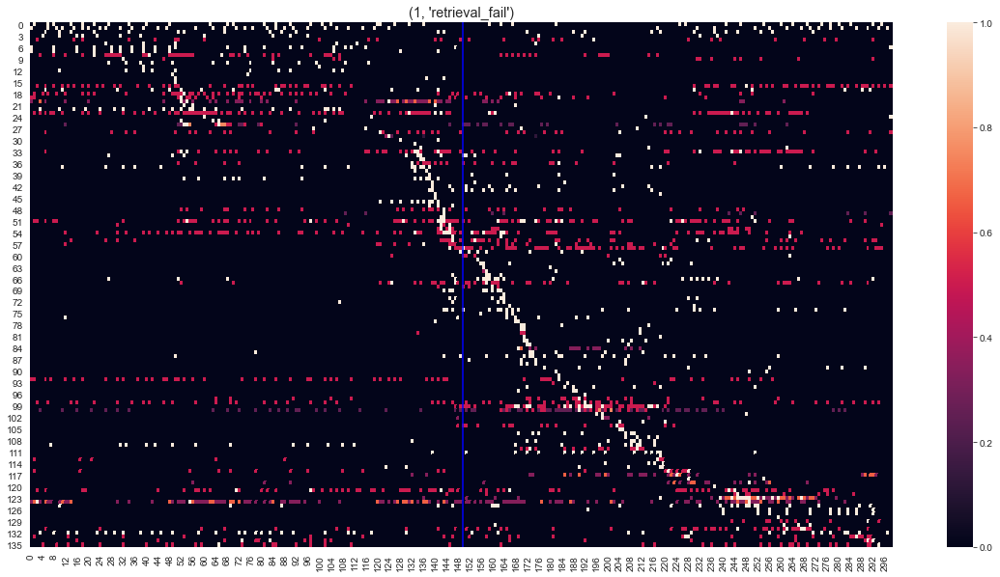

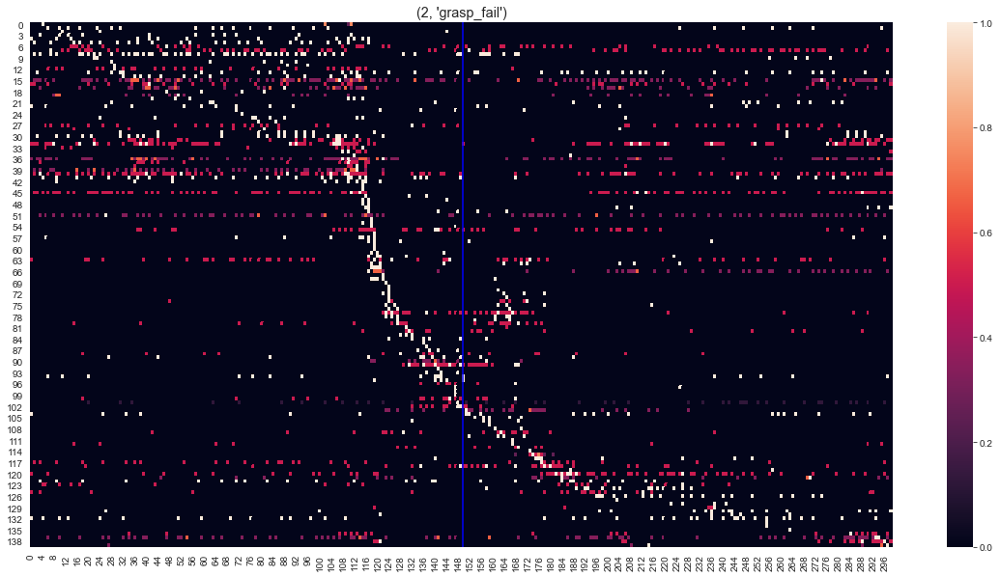

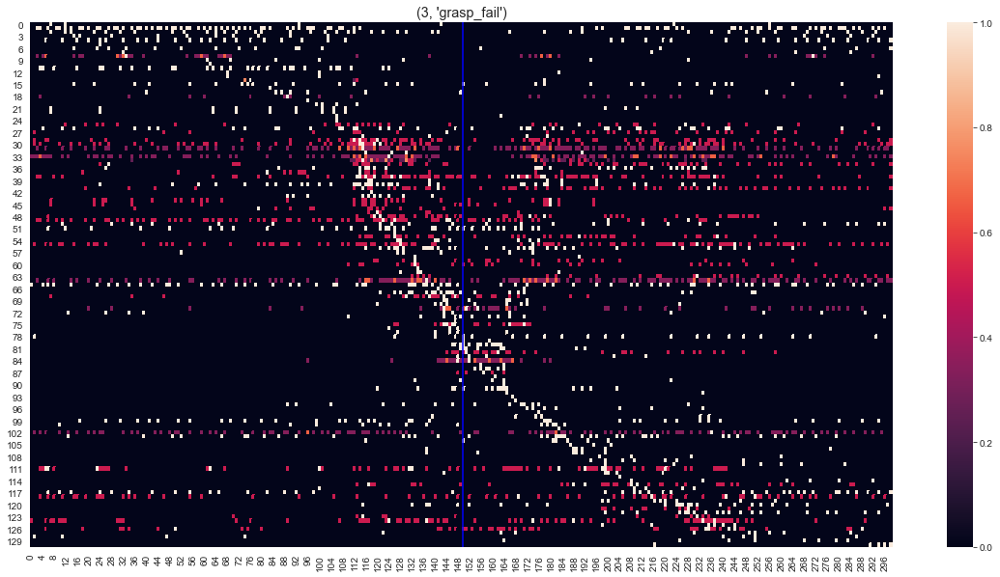

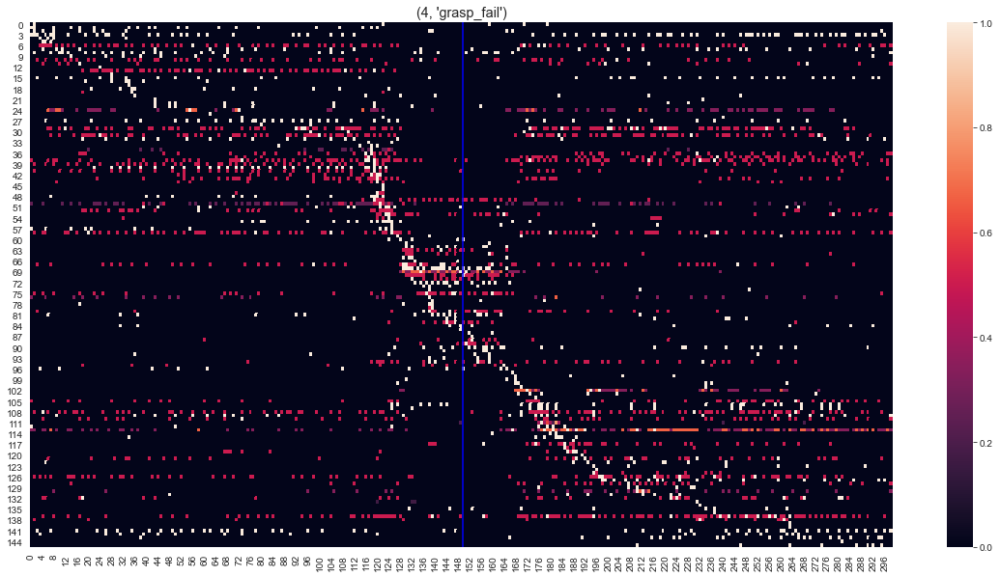

...

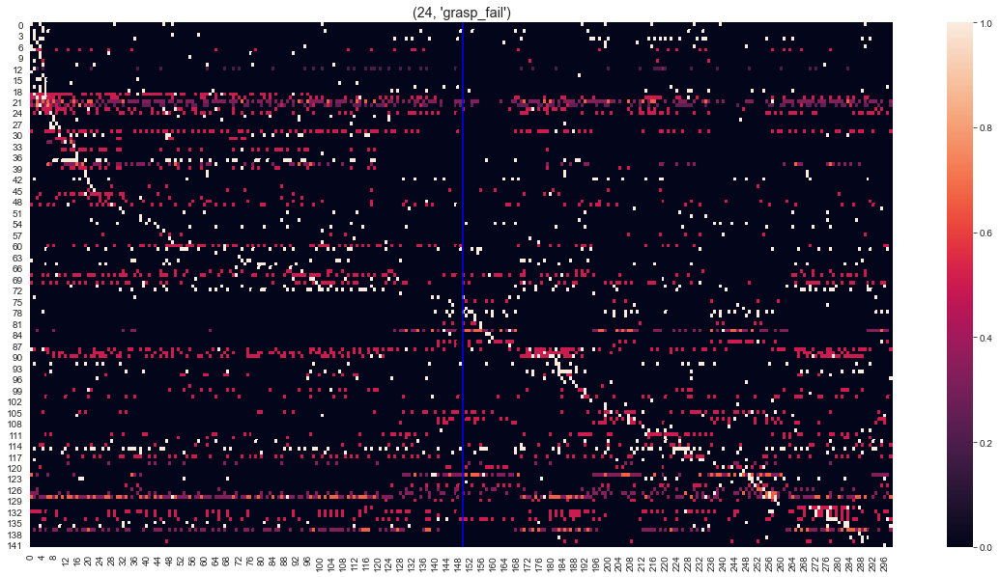

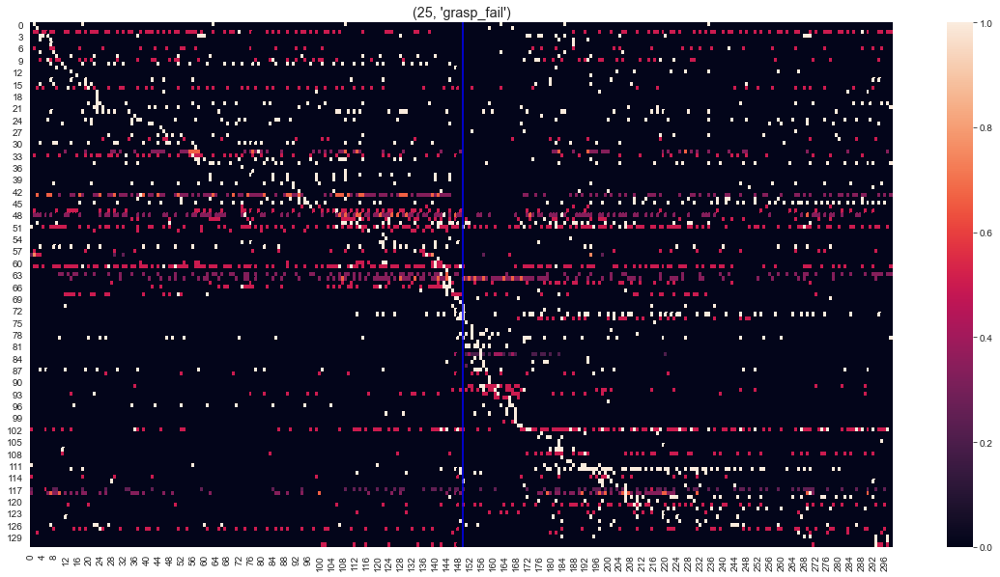

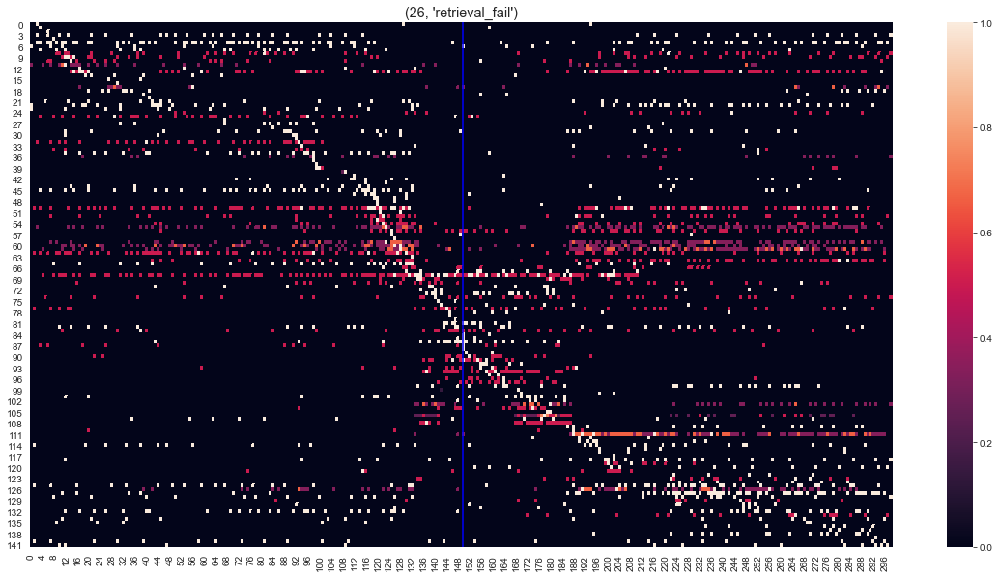

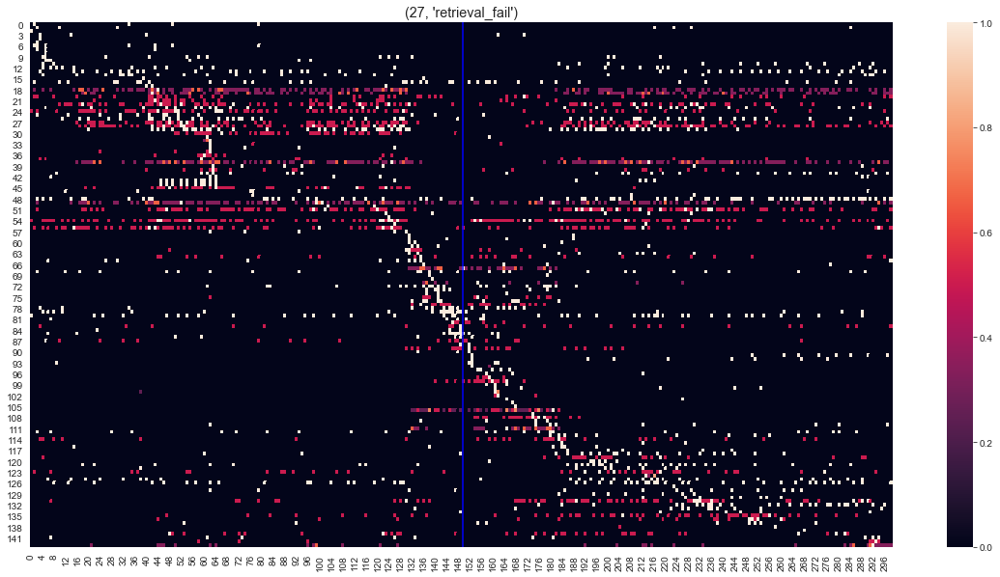

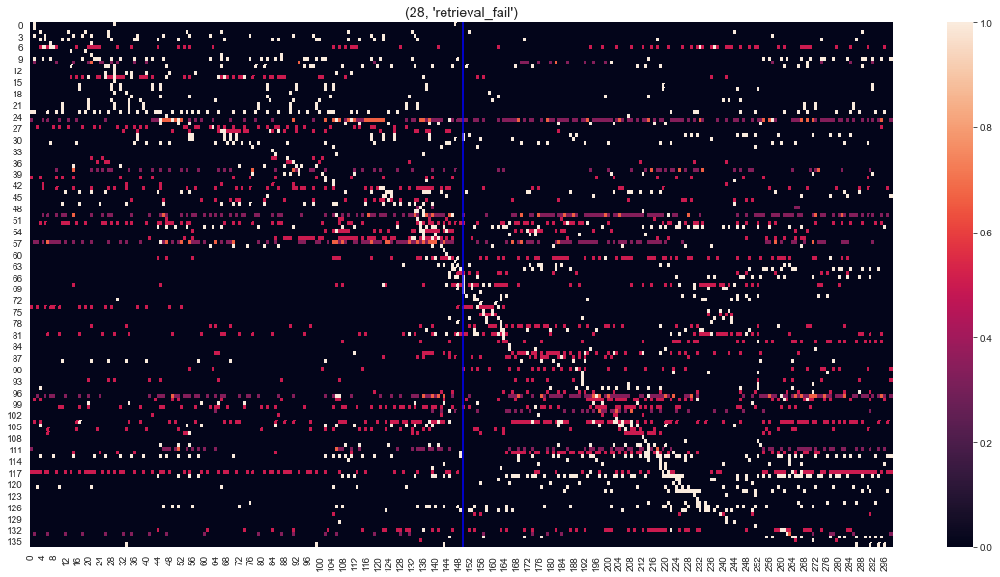

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

In [353]:
#RS
bytrial_heatmap(df_wc,df_reaches,-3,3,binsize = 0.020)

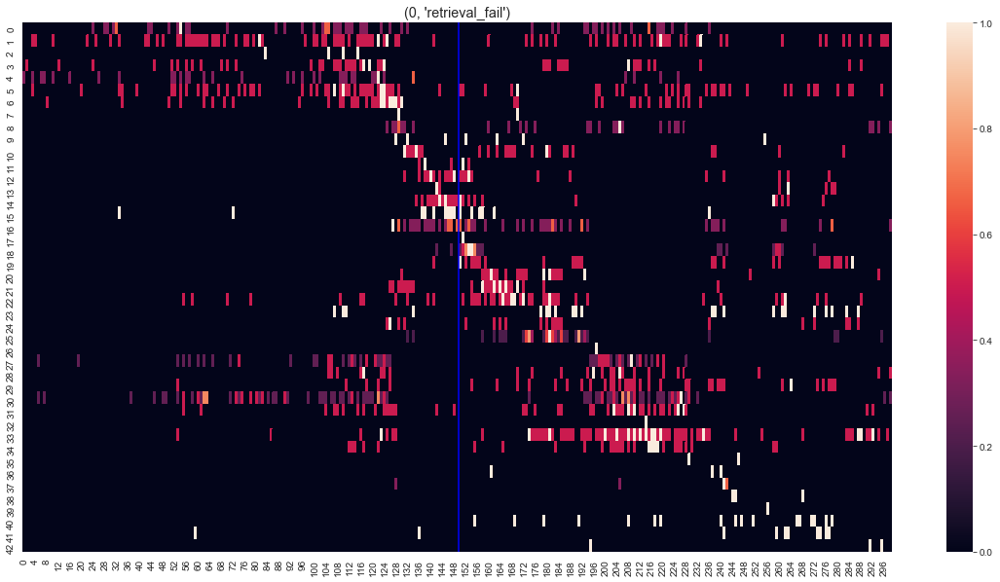

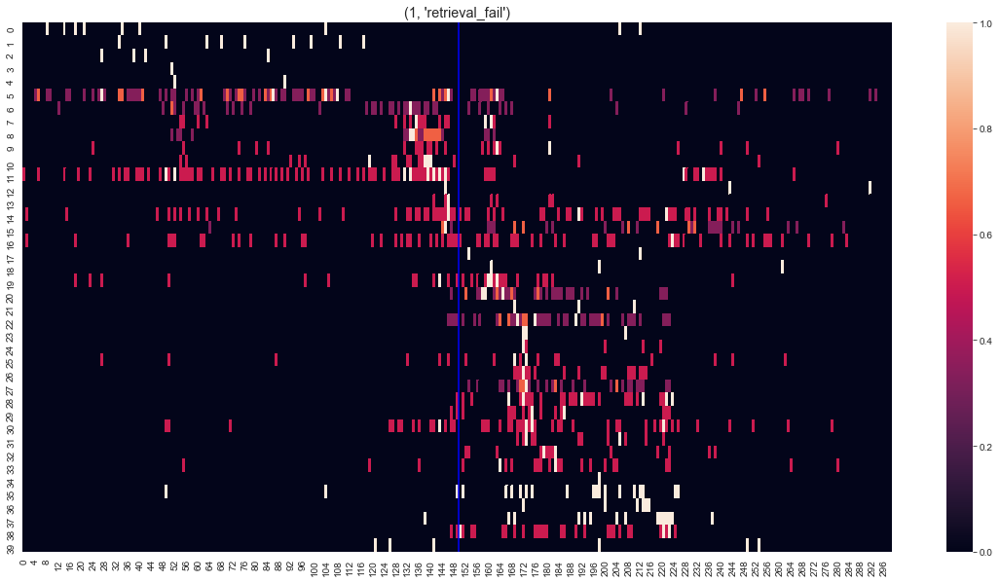

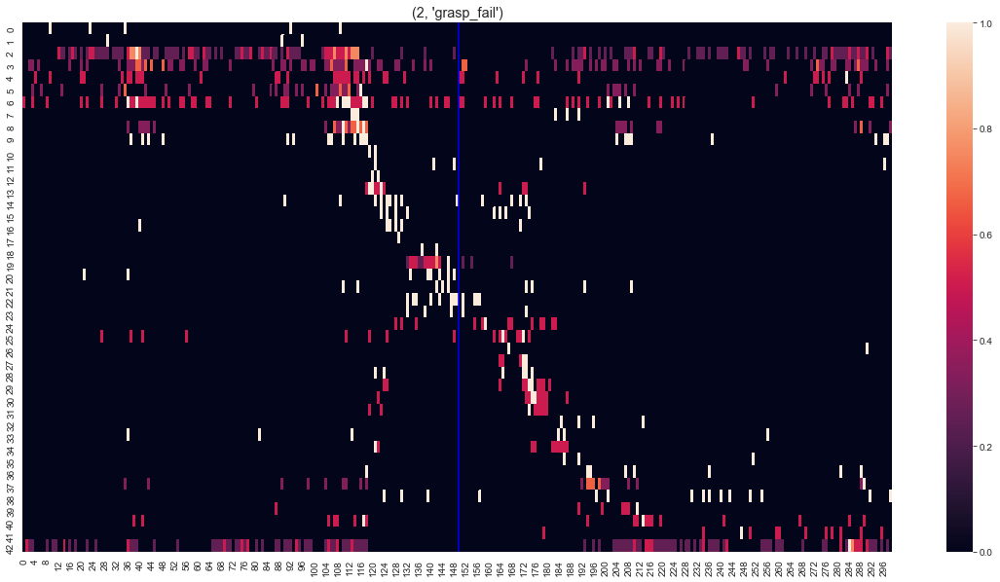

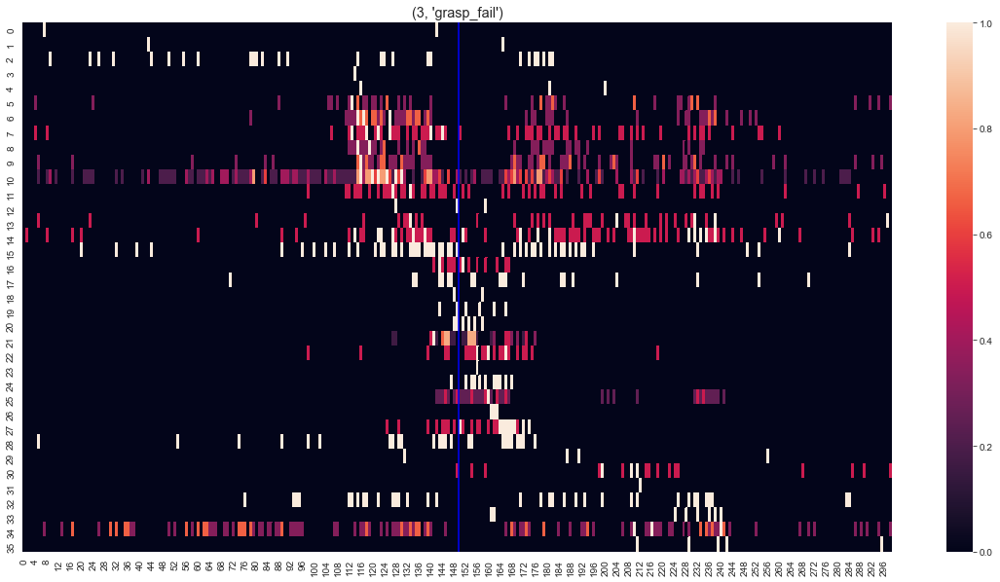

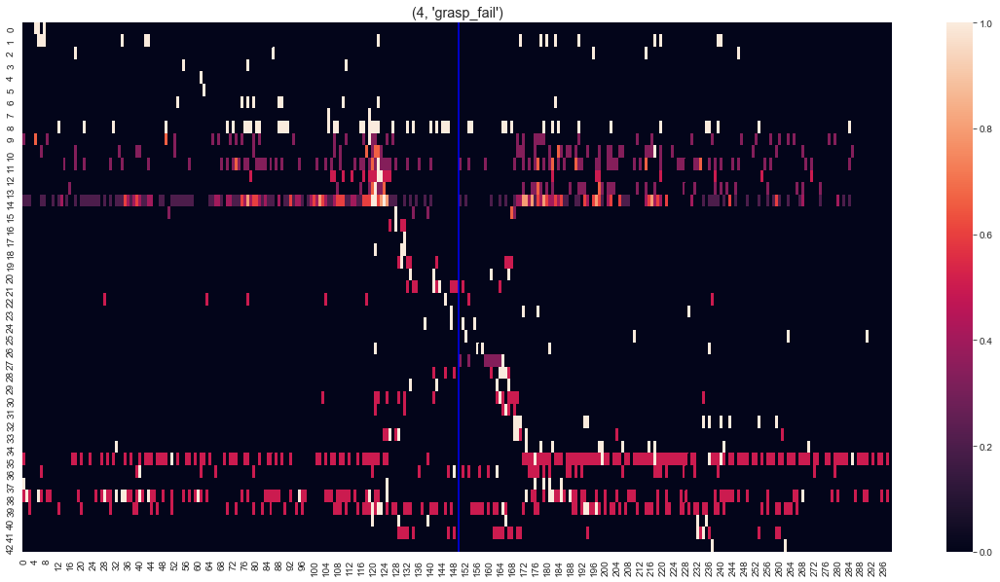

...

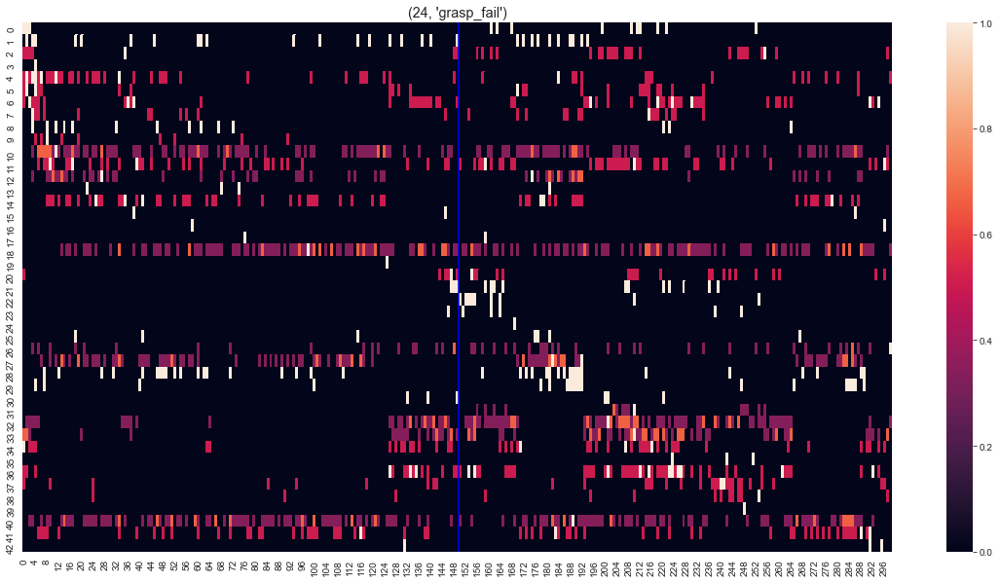

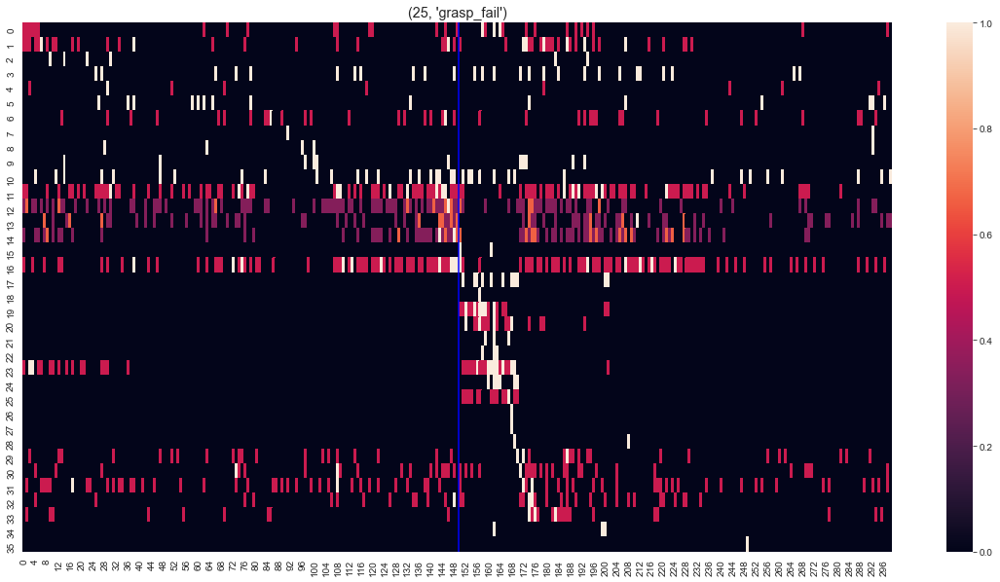

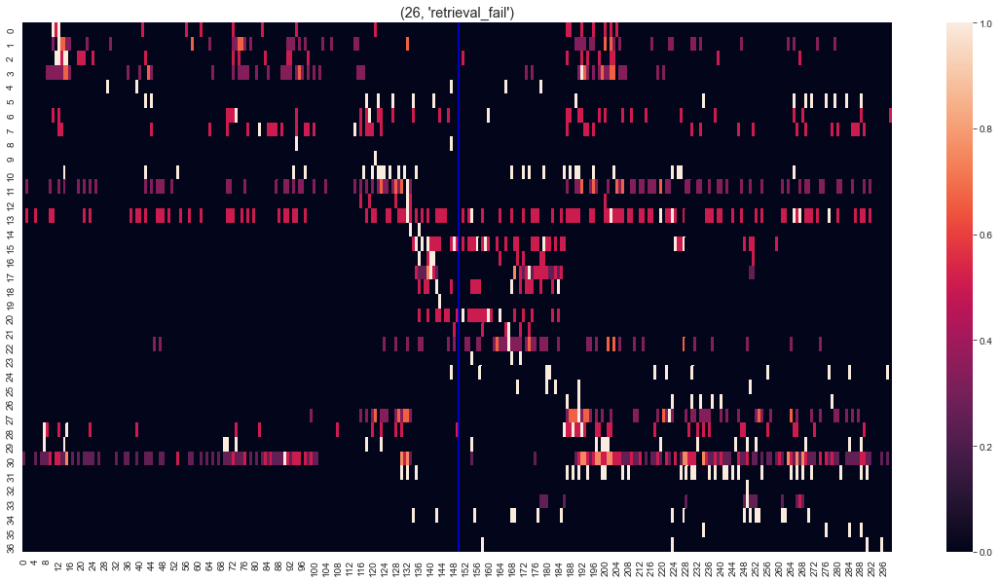

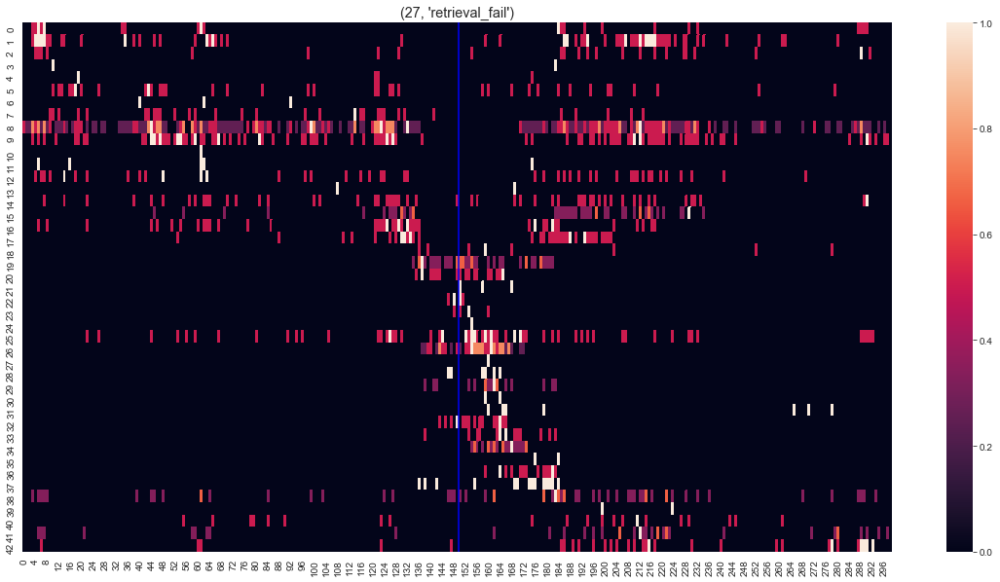

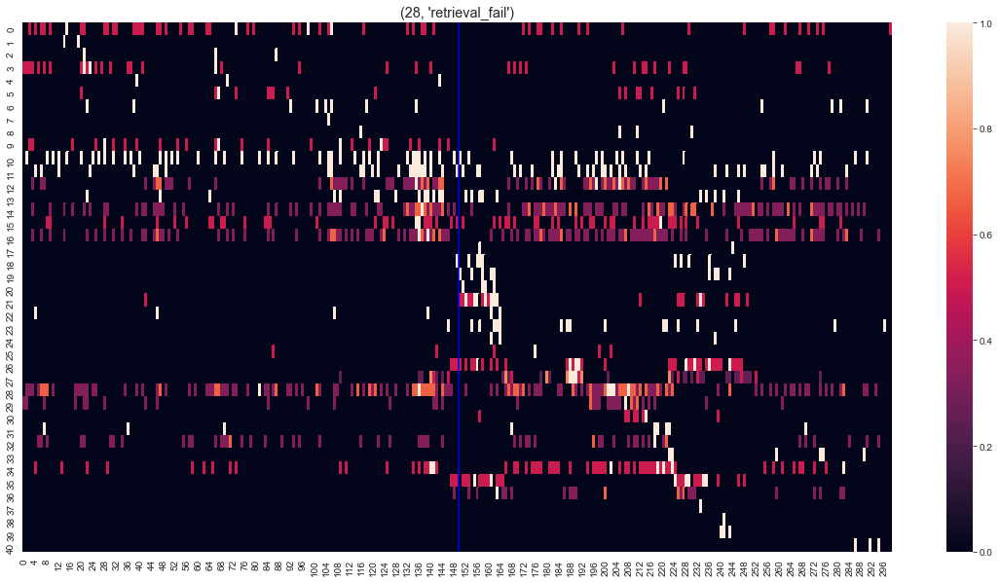

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 []]

In [355]:
#FS
bytrial_heatmap(df_wc,df_reaches,-3,3,binsize = 0.020)

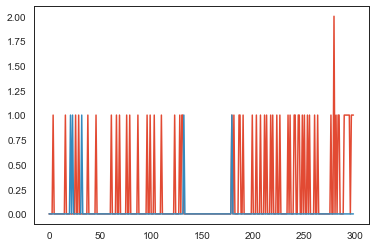

In [184]:
#plt.plot(ave_reach[0])
plt.plot(ave_reach[1])
plt.plot(ave_reach[3])

# save bins for GPFA

In [6]:
folder = r'Z:\BIOElectricsLab\Kim\NPX_recordings\MOBPNPX_cohort2_10_2022'
df2 = pd.read_json(os.path.join(folder,'df_aligned.json'))
dfr2 = pd.read_json(os.path.join(folder,'df_reaches.json'))

In [7]:
df2.mouse.unique()

array([ 97, 100, 101, 104,  99, 103,  96, 102], dtype=int64)

In [47]:
df = df2[df2.mouse==97]
df_reaches = dfr2[dfr2.mouse==97]

In [49]:
alltrials = get_trials(df,df_reaches,-0.5,0.5,0.020)
df_reaches['index'] = df_reaches.index
df_reaches['bins'] = alltrials

In [50]:
df_reaches.to_json(r'C:\Users\Kim\Documents\Data\kimdata\gpfa\m97_.json')

# PCA single trial trajectories

In [92]:
trajs, evs = pca_singletrial(df,df_reaches,-1.0,1.0,0.020)
df_reaches['trajs'] = trajs
df_reaches['evs'] = evs

In [468]:
#plot single trial PCA trajectories

x = df_reaches[df_reaches.behaviors!='success'].trajs
y = df_reaches[df_reaches.behaviors!='success'].trajs
z = df_reaches[df_reaches.behaviors!='success'].trajs


for i,trajs in enumerate(x):
    ax = plt.axes(projection='3d')
    fig = plt.figure()
    ind = df_reaches[df_reaches.behaviors!='success'].index[i]
    ax.plot3D(x[ind][0],y[ind][1],z[ind][2])

# PCA trajectories by layer 

In [302]:
df_reaches['mouse'] = 18

In [19]:
mouse=[18]

In [20]:
df_pcs = pd.DataFrame(data=mouse,columns=['mouse'])

In [303]:
dfr10 = df_reaches

ave_reachs = []
normedbinss = []
maxdf_bins = []
mindf_bins = []
ave_reachsf = []
normedbinssf = []
maxdf_binsf = []
mindf_binsf = []
stims = []
trajs = []
evs = []


for mouseid in df.mouse.unique():
    a = int(mouseid)
    dfr_ = dfr10[dfr10.mouse==a]
    df_ = df[df.mouse==mouseid]
    
    dfr_s = dfr_[dfr_.behaviors=='success']
    dfr_f = dfr_[dfr_.behaviors!='success']
    
    
    ave_reach,normedbins,ave_reach_  = reachave_tensor(df_,dfr_s,start = 3,end = 3) 
    ave_reachf,normedbins_f,ave_reach_f  = reachave_tensor(df_,dfr_f,start = 3,end = 3) #for first stim type in df_
    mod_up, mod_down, maxfr_ts, minfr_ts, a = movement_mod(df_,dfr_s,startb = -1.0,endb = -0.5,starte = -3,ende = 3,binsize=0.001)
    df['mod_up'] = mod_up
    df['mod_down'] = mod_down
    df['peakup'] = maxfr_ts
    df['peakdown'] = minfr_ts
    
    mod_upf, mod_downf, maxfr_tsf, minfr_tsf, a = movement_mod(df_,dfr_f,startb = -1.0,endb = -0.5,starte = -3,ende = 3,binsize=0.001)
    df['mod_upf'] = mod_upf
    df['mod_downf'] = mod_downf
    df['peakupf'] = maxfr_tsf
    df['peakdownf'] = minfr_tsf
        
    ave_reachs.append(ave_reach) 
    normedbinss.append(normedbins)
    
    ave_reachsf.append(ave_reachf) 
    normedbinssf.append(normedbins_f)

    trial_concat= np.concatenate((ave_reach,ave_reachf),axis=1)
    centr_traj = center(trial_concat)       
    traj,ev = pca(centr_traj)
    trajs.append(traj)
    evs.append(ev)

df_pcs['ave_bins'] = ave_reachs
df_pcs['normedbins'] = normedbinss

#df_pcs['stims'] = stims
#df_pcs['tones'] = tones

df_pcs['ave_bins_f'] = ave_reachsf
df_pcs['normedbins_f'] = normedbinssf

#df_pcs['stims_f'] = stimsf
#df_pcs['tones_f'] = tonesf

df_pcs['traj_sf'] = trajs
df_pcs['ev_sf'] = evs

In [304]:
df = df.reset_index()

In [305]:
df_reaches = df_reaches.drop('index',axis=1)

In [157]:
dfr = df_reaches[df_reaches.index==7]

In [331]:
dfr10 = df_reaches

ave_reachs = []
normedbinss = []
maxdf_bins = []
mindf_bins = []
ave_reachsf = []
normedbinssf = []
maxdf_binsf = []
mindf_binsf = []
stims = []
trajs = []
evs = []


for mouseid in df.mouse.unique():
    a = int(mouseid)
    dfr_ = dfr10[dfr10.mouse==a]
    df_ = df[df.mouse==mouseid]
    
    dfr_s = dfr_[dfr_.behaviors=='success']
    dfr_f = dfr_[dfr_.behaviors!='success']
    
    
    ave_reach,normedbins,ave_reach_  = reachave_tensor(df_,dfr_s,start = 3,end = 3) 
    ave_reachf,normedbins_f,ave_reach_f  = reachave_tensor(df_,dfr_f,start = 3,end = 3) #for first stim type in df_
    mod_up, mod_down, maxfr_ts, minfr_ts, a = movement_mod(df_,dfr_s,startb = -1.0,endb = -0.5,starte = -3,ende = 3,binsize=0.001)
    df['mod_up'] = mod_up
    df['mod_down'] = mod_down
    df['peakup'] = maxfr_ts
    df['peakdown'] = minfr_ts

    mod_upf, mod_downf, maxfr_tsf, minfr_tsf, a = movement_mod(df_,dfr_f,startb = -1.0,endb = -0.5,starte = -3,ende = 3,binsize=0.001)
    df['mod_upf'] = mod_upf
    df['mod_downf'] = mod_downf
    df['peakupf'] = maxfr_tsf
    df['peakdownf'] = minfr_tsf
        
    ave_reachs.append(ave_reach) 
    normedbinss.append(normedbins)
    
    ave_reachsf.append(ave_reachf) 
    normedbinssf.append(normedbins_f)

df_pcs['ave_bins'] = ave_reachs
df_pcs['normedbins'] = normedbinss

#df_pcs['stims'] = stims
#df_pcs['tones'] = tones


#df_pcs['stims_f'] = stimsf
#df_pcs['tones_f'] = tonesf



In [116]:
#save trajectories not split by laminar location
traj_all_lam = traj
ev_all_lam = ev

In [277]:
#save L2-3
traj_L23 = traj
ev_L23m = ev

In [279]:
traj_L5 = traj
ev_L5 = ev

In [23]:
df['mouse'] = 8

NameError: name 'mouse' is not defined

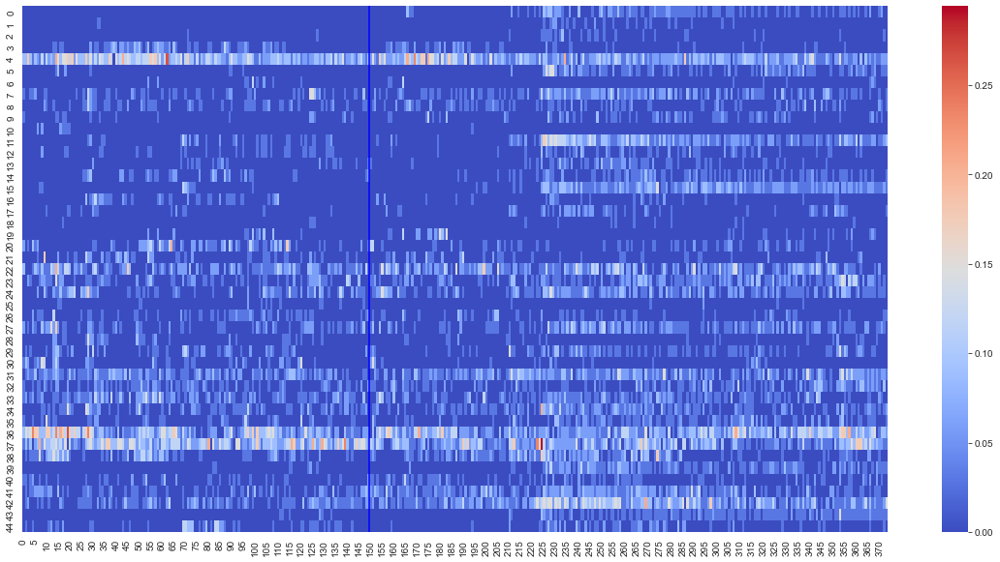

In [26]:
df['binz'] = ave_reach
df_s= df.sort_values(by=['peakup'])
df_bins_ = df_s.binz
df_heatmap_ = list(filter(any, df_bins_))
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df_heatmap_,cmap='coolwarm')
plt.gca().axvline(150,c='b',ls='-')
plt.title(mouse)
#save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
#fig.savefig(save_path+'move_related'+'up'+'s'+'.png')

# Clustering

In [ ]:
# change number of clusters
# change timeframe

In [144]:
df_reaches = dfr[dfr.behaviors=='success']

In [21]:
ave_reach, normedbins, ave_reach_ = reachave_tensor(df,df_reaches,start = -0.5,end = 8) 

In [146]:
df['binz'] = ave_reach

In [147]:
def center(X):
    # X: ndarray, shape (n_features, n_samples)
    ss = StandardScaler(with_mean=True, with_std=True)
    Xc = ss.fit_transform(X.T).T
    return Xc



def pca_byunit(tens):
    for i in range(min(tens.shape[0], tens.shape[1])-1):
        pca = PCA(n_components=i)
        p=pca.fit_transform(tens)
        ev = (pca.explained_variance_ / sum(pca.explained_variance_))
    return p,ev

In [148]:
x = center(ave_reach_)

In [149]:
unit_pcs,ev = pca_byunit(x)

In [150]:
unit_pcs = list(unit_pcs)

In [151]:
df['unit_pcs'] = unit_pcs

In [152]:
from sklearn.cluster import AgglomerativeClustering

In [153]:
model = AgglomerativeClustering(n_clusters=4)

model = model.fit(ave_reach)

In [154]:
model.labels_

array([2, 3, 0, 2, 2, 2, 2, 2, 2, 3, 3, 2, 0, 3, 3, 3, 2, 2, 2, 1, 3, 0,
       2, 2, 2, 3, 0, 2, 1, 3, 2, 3, 1, 3, 3, 3, 2, 2, 3, 2, 3, 2, 3, 3,
       2, 2], dtype=int64)

In [155]:
dims = []
for i,pcs in enumerate(unit_pcs):
    dims.append(pcs)

In [156]:
df['unit_pcs'] = dims

In [157]:
dims_2ds = []
for i,pc in enumerate(df.unit_pcs):
    dims_2D = [pc[0],pc[1]]
    dims_2ds.append(dims_2D)

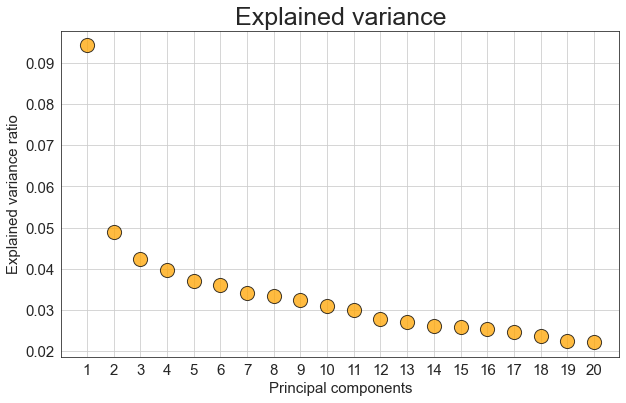

In [158]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(ev[0:20]))],
            y=ev[0:20],
           s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance",fontsize=25)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(ev[0:20]))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

In [161]:
x = model.labels_
df['labels_pcs'] = x

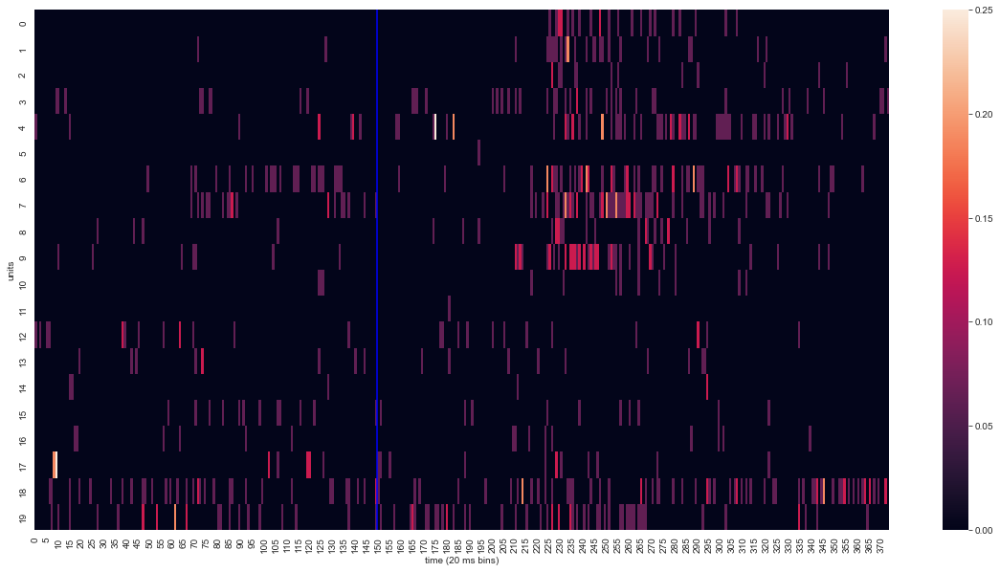

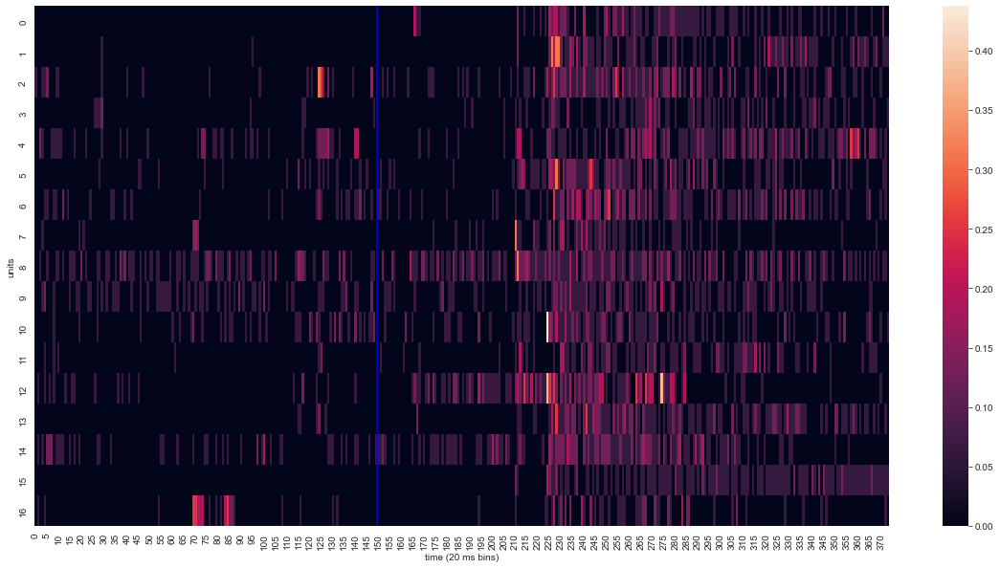

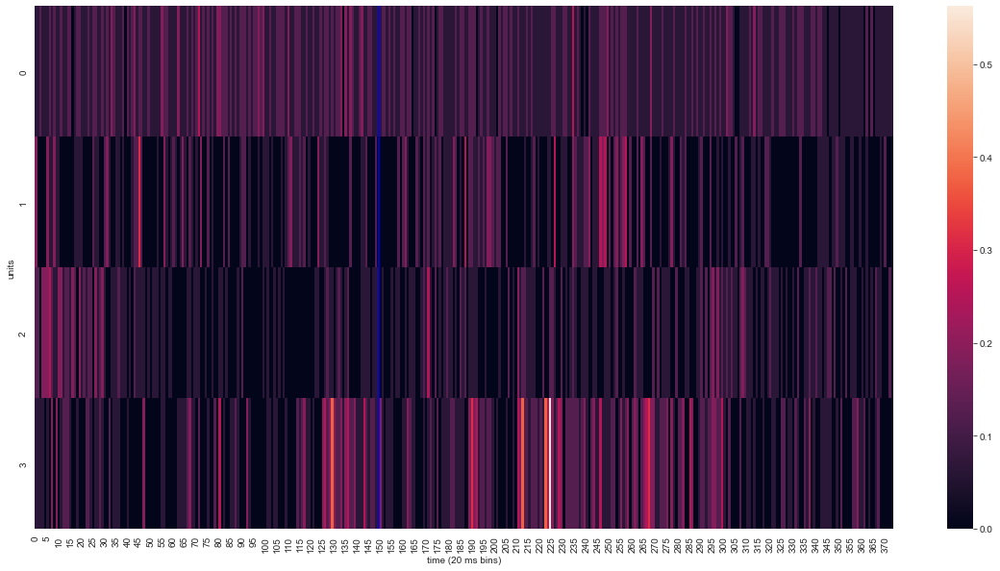

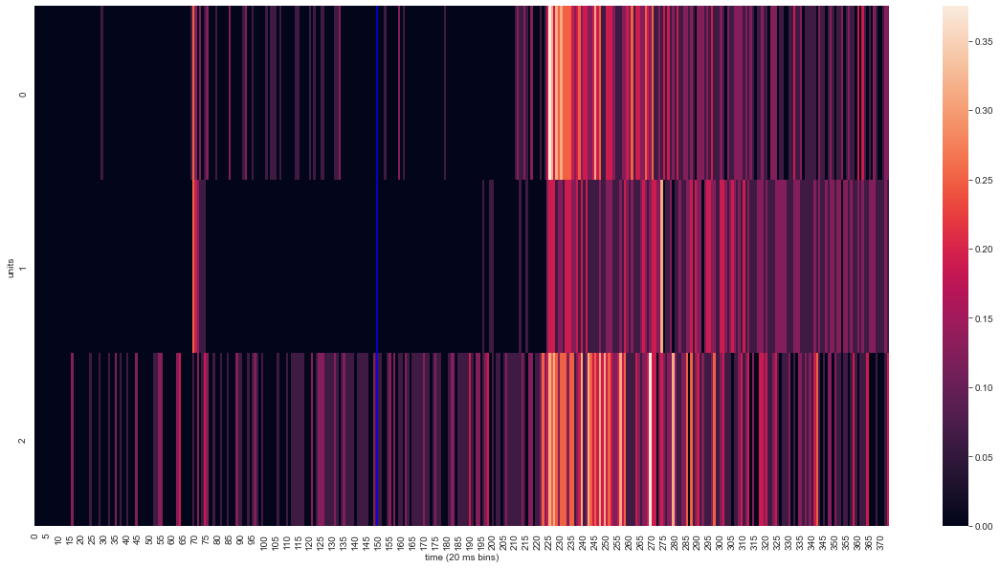

In [162]:
for clust in df.labels_pcs.unique():
    df_test = df[df.labels_pcs==clust]
    df_s= df_test.sort_values(by=['peakup'])
    df_bins_ = df_s.binz
    df_heatmap_ = list(filter(any, df_bins_))
    fig, ax = plt.subplots(figsize=(20, 10))
    sns.heatmap(df_heatmap_)
    plt.gca().axvline(150,c='b',ls='-')
    plt.xlabel('time (20 ms bins)')
    plt.ylabel('units')
    #plt.title('failure ordered by success peak fr')
    #save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/clustering/succ_8clusters/'
    #fig.savefig(save_path+str(clust)+'.png')

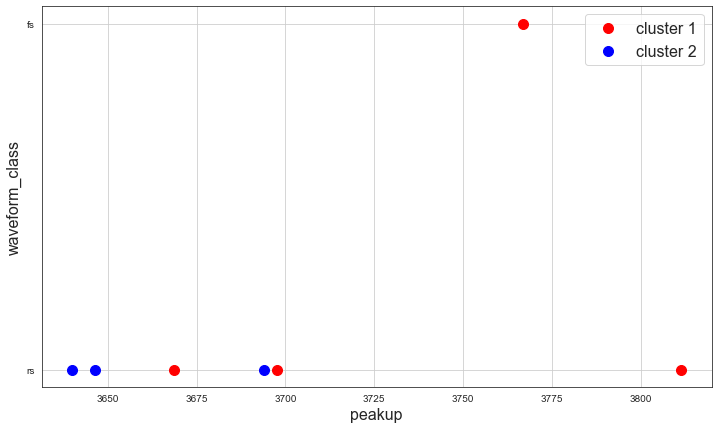

In [165]:

plt.figure(figsize=(12,7))
plt.scatter(df[df.labels==0].ypos, df[df.labels==0].waveform_class, s = 100, c = 'red', label = 'cluster 1')
plt.scatter(df[df.labels==1].ypos, df[df.labels==1].waveform_class, s = 100, c = 'blue', label = 'cluster 2')
#plt.scatter(df[df.labels==2].ypos, df[df.labels==2].waveform_class, s = 100, c = 'yellow', label = 'cluster 3')


plt.xlabel('peakup',fontsize=16)
plt.ylabel('waveform_class',fontsize=16)
plt.legend(fontsize=16)
plt.grid(True)
plt.show()

In [164]:
dft = df.drop(['times','mouse','cell','waveform','binz'],axis=1)

In [88]:
df = df.drop(['template','xpos','waveform_weights','experiment','probe','cohort'],axis=1)

In [91]:
df = df.drop(['labels_one','waveform_repolarizationslope','waveform_PTratio','waveform_duration'],axis=1)

In [95]:
df = df.drop(['mod_down_s','mod_up_s','peakup_s','peakdown_s'],axis=1)

In [220]:
down = df.peakdownf
up = df.peakupf

(array([159.,  16.,   7.,   7.,   7.,  39.,   3.,   7.,   6.,   9.]),
 array([-2.901, -2.314, -1.727, -1.14 , -0.553,  0.034,  0.621,  1.208,
         1.795,  2.382,  2.969]),
 <BarContainer object of 10 artists>)

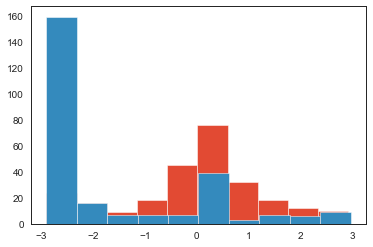

In [222]:
plt.hist(up)
plt.hist(down)

# Clustering metrics

In [40]:
from sklearn.cluster import KMeans

In [368]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

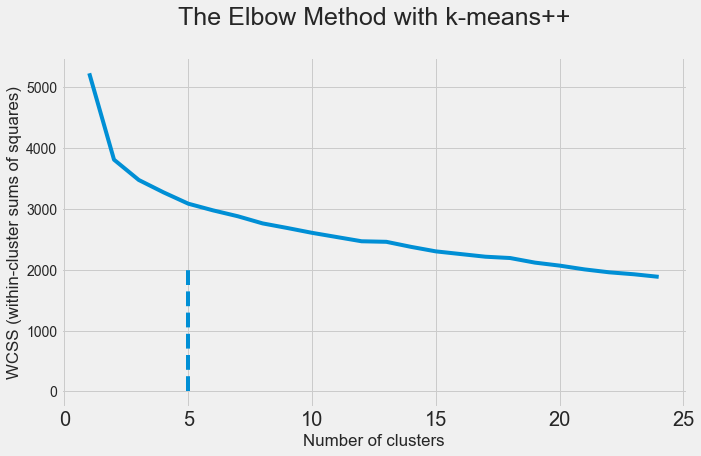

In [366]:
wcss = []
for i in range(1, 25):
    kmeans = KMeans(n_clusters = i, init = 'k-means++')
    kmeans.fit(ave_reach) # or unit_pcs for dim reduced
    wcss.append(kmeans.inertia_)

with plt.style.context(('fivethirtyeight')):
    plt.figure(figsize=(10,6))
    plt.plot(range(1, 25), wcss)
    plt.title('The Elbow Method with k-means++\n',fontsize=25)
    plt.xlabel('Number of clusters')
    plt.xticks(fontsize=20)
    plt.ylabel('WCSS (within-cluster sums of squares)')
    plt.vlines(x=5,ymin=0,ymax=2000,linestyles='--')
    plt.show()

In [370]:

from sklearn.preprocessing import MinMaxScaler

In [371]:
scaler = MinMaxScaler()

In [372]:
X_scaled=scaler.fit_transform(ave_reach)

In [377]:

km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    #v_measure = v_measure_score(y,preds)
    #vmeasure_score.append(v_measure)
    #print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -1454.010097190797
Silhouette score for number of cluster(s) 2: 0.5575175870028088
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1340.580244675862
Silhouette score for number of cluster(s) 3: 0.4893632072147995
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -1272.2452490582893
Silhouette score for number of cluster(s) 4: 0.39777600429935844
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -1232.3456016331877
Silhouette score for number of cluster(s) 5: 0.3906229816835876
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 6: -1198.334228091237
Silhouette score for number of cluster(s) 6: 0.42003420918307377
-------

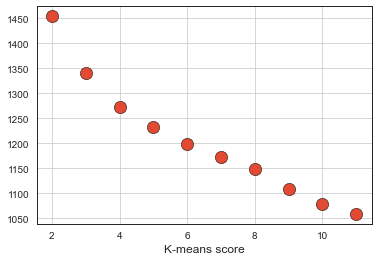

In [382]:

plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

In [383]:
dfx_trans = pd.DataFrame(data=unit_pcs)

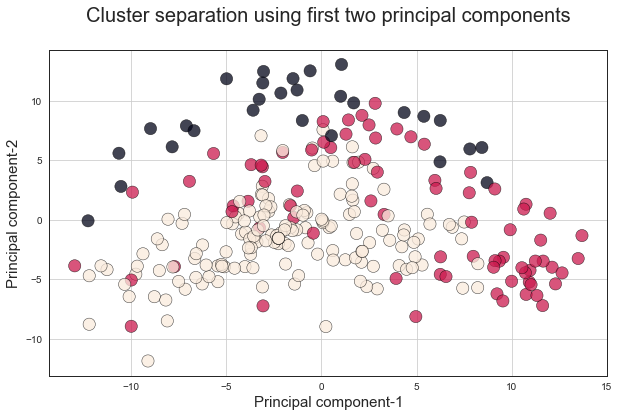

In [389]:

plt.figure(figsize=(10,6))
plt.scatter(dfx_trans[0],dfx_trans[1],c=df['labels'],edgecolors='k',alpha=0.75,s=150)
plt.grid(True)
plt.title("Cluster separation using first two principal components\n",fontsize=20)
plt.xlabel("Principal component-1",fontsize=15)
plt.ylabel("Principal component-2",fontsize=15)
plt.show()

In [392]:
shape(silhouette)

()

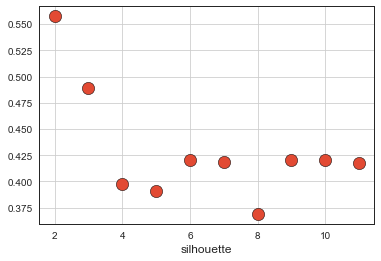

In [393]:
plt.scatter(x=[i for i in range(2,12)],y=km_silhouette,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("silhouette")
plt.show()

In [374]:
from sklearn.manifold import TSNE
from scipy.cluster.vq import kmeans2

Text(0.5, 1.0, 'learning rate: 150   perplexity: 50')

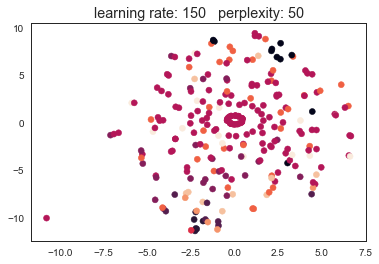

In [167]:
X_tsne = TSNE(learning_rate=80,perplexity=20).fit_transform(ave_reach)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1],c=df.labels_one)
plt.gca().set_title('learning rate: '+str(150)+'   perplexity: '+str(50))

Text(0.5, 1.0, 'k=3')

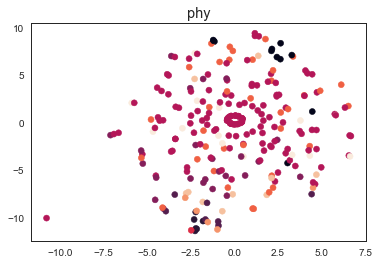

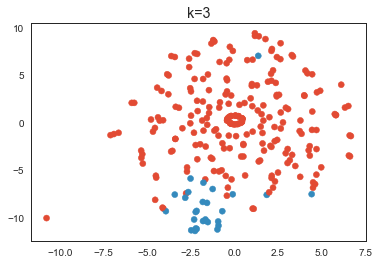

In [168]:
kn=3
km = kmeans2(ave_reach,
        kn, iter=300, thresh=5e-6,minit='random')
c2 = np.array([sns.color_palette()[k] for k in km[1]])
plt.scatter(X_tsne[:, 0], X_tsne[:, 1],c=np.array(df.labels_one))
plt.gca().set_title('phy')
plt.figure()
plt.scatter(X_tsne[:, 0], X_tsne[:, 1],c=c2)
plt.gca().set_title('k='+str(kn))

# correlation matrix of clusters

In [215]:

def correlation_matrix(df):
    from matplotlib import pyplot as plt
    from matplotlib import cm as cm

    fig = plt.figure(figsize=(16,12))
    ax1 = fig.add_subplot(111)
    cmap = cm.get_cmap('jet', 30)
    cax = ax1.imshow(df.corr(), interpolation="nearest", cmap=cmap)
    ax1.grid(True)
    labels=df.columns
    ax1.set_xticklabels(labels,fontsize=9)
    ax1.set_yticklabels(labels,fontsize=9)
    # Add colorbar, make sure to specify tick locations to match desired ticklabels
    fig.colorbar(cax, ticks=[0.1*i for i in range(-11,11)])
    plt.show()

AttributeError: 'tuple' object has no attribute 'corr'

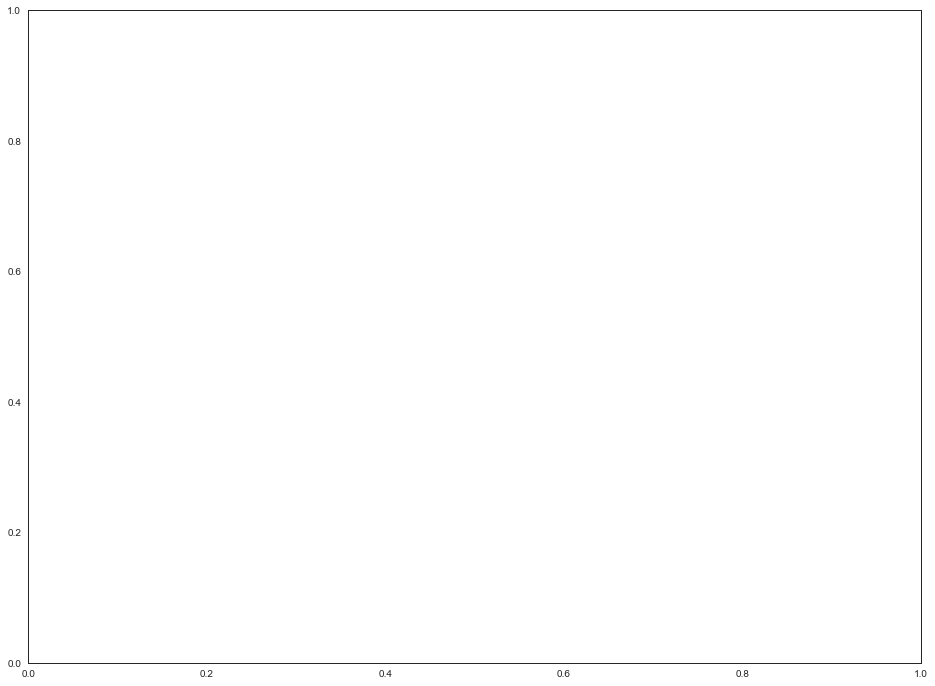

In [216]:
correlation_matrix(ave_reach)

# random analysis, scatter plots of features, etc

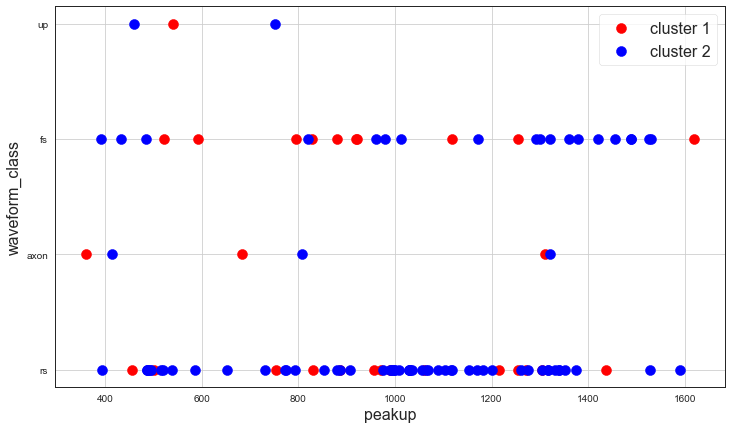

In [283]:

plt.figure(figsize=(12,7))
plt.scatter(df[df.labels==0].ypos, df[df.labels==0].waveform_class, s = 100, c = 'red', label = 'cluster 1')
plt.scatter(df[df.labels==1].ypos, df[df.labels==1].waveform_class, s = 100, c = 'blue', label = 'cluster 2')
#plt.scatter(df[df.labels==2].ypos, df[df.labels==2].waveform_class, s = 100, c = 'yellow', label = 'cluster 3')


plt.xlabel('peakup',fontsize=16)
plt.ylabel('waveform_class',fontsize=16)
plt.legend(fontsize=16)
plt.grid(True)
plt.show()

In [155]:
dft = df.drop(['times','mouse','cell','waveform','binz'],axis=1)

In [88]:
df = df.drop(['template','xpos','waveform_weights','experiment','probe','cohort'],axis=1)

In [91]:
df = df.drop(['labels_one','waveform_repolarizationslope','waveform_PTratio','waveform_duration'],axis=1)

In [95]:
df = df.drop(['mod_down_s','mod_up_s','peakup_s','peakdown_s'],axis=1)

In [220]:
down = df.peakdownf
up = df.peakupf

(array([159.,  16.,   7.,   7.,   7.,  39.,   3.,   7.,   6.,   9.]),
 array([-2.901, -2.314, -1.727, -1.14 , -0.553,  0.034,  0.621,  1.208,
         1.795,  2.382,  2.969]),
 <BarContainer object of 10 artists>)

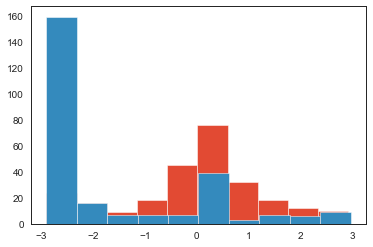

In [222]:
plt.hist(up)
plt.hist(down)

In [427]:
df['succ2_d'] = None # Create new column, with only None values

for indx, value in enumerate(succ2_d):
    df['succ2_d'][value] = indx # Set index (List element number) to indx (Order in indices list)

#df = df.sort_values(by=['NewIndex']) # Sort by new column

In [428]:
normedbins_2 = normedbins

In [335]:
df_ = df[df.waveform_class=='rs']

Text(160.0, 0.5, 'units')

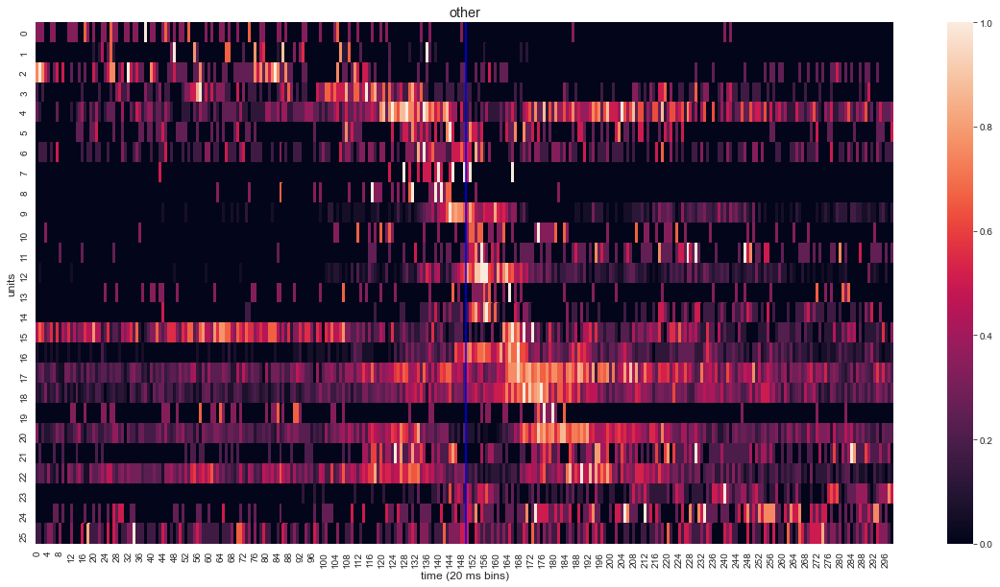

In [345]:
df['binz'] = normedbins_f
df_ = df[df.waveform_class!='fs'][df.waveform_class!='rs']
#df_ = df[df.waveform_class!='fs']
df_s= df_.sort_values(by=['peakupf'])
df_bins_ = df_s.binz
df_heatmap_ = list(filter(any, df_bins_))
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df_heatmap_)
plt.gca().axvline(150,c='b',ls='-')
plt.title('other')
plt.xlabel('time (20 ms bins)')
plt.ylabel('units')
#save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
#fig.savefig(save_path+'move_related'+'up'+'s'+'.png')

In [81]:
succ1 = df_s.index

In [154]:
succ2 = df_s.index

In [82]:
df['succ1'] = succ1

In [155]:
df['succ2'] = succ2

In [158]:
df['binz'] = normedbins
df_s= df.sort_values(by=['succ2_d'])
df_bins_ = df_s.binz
df_heatmap_ = list(filter(any, df_bins_))
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df_heatmap_)
plt.gca().axvline(150,c='b',ls='-')
plt.title(mouse)
#save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
#fig.savefig(save_path+'move_related'+'down'+'s'+'.png')

KeyError: 'succ2_d'

In [43]:
df['binz'] = avebins
df_s= df.sort_values(by=['peakup'])
df_bins_ = df_s.binz
df_heatmap_ = list(filter(any, df_bins_))
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df_heatmap_)
plt.gca().axvline(150,c='b',ls='-')
plt.title(mouse)
#save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
#fig.savefig(save_path+'move_related'+'down'+'s'+'.png')

NameError: name 'avebins' is not defined

In [123]:
succ1 = df_s.index

In [124]:
df['succ1'] = succ1

In [125]:
normedbins_succ1_20 = normedbins

In [157]:
normedbins = normedbins_succ1_20

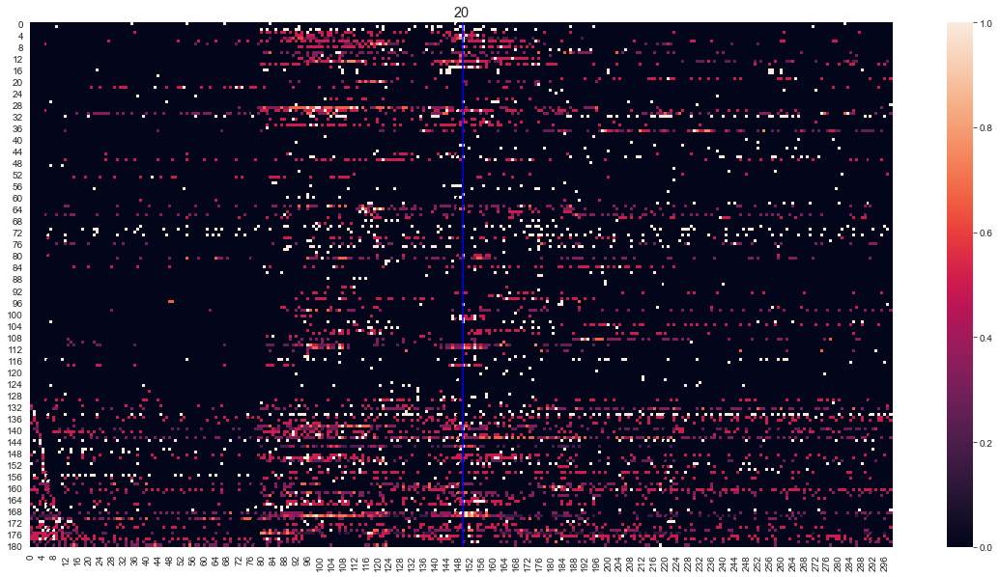

In [151]:
df['binz'] = normedbins
df_s= df.sort_values(by=['peakdown'])
df_bins_ = df_s.binz
df_heatmap_ = list(filter(any, df_bins_))
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df_heatmap_)
plt.gca().axvline(150,c='b',ls='-')
plt.title(mouse)
save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
fig.savefig(save_path+'move_related'+'down'+'f'+'.png')

In [20]:
df['binz'] = ave_reach
df_s= df.sort_values(by=['peakup'])
df_bins_ = df_s.binz
df_heatmap_ = list(filter(any, df_bins_))
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(df_heatmap_)
plt.gca().axvline(150,c='b',ls='-')
plt.title(mouse)
save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
fig.savefig(save_path+'move_related'+'up'+'f'+'.png')

NameError: name 'ave_reach' is not defined

In [941]:
from matplotlib import animation 
from IPython.display import HTML

In [ ]:
pca_frame = []
for t in range(trial_size):
    # projected data for all trials at time t 
    Xp = np.hstack([tr[:, None, t] for tr in projected_trials]).T
    pca_frame.append(Xp)

In [943]:
def style_3d_ax(ax):
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.set_xlabel('PC 1')
    ax.set_ylabel('PC 2')
    ax.set_zlabel('PC 3')

In [948]:
#for c in range(Xa_p.shape[0]):
    #Xa_p[c, :] =  gaussian_filter1d(Xa_p[c, :], sigma=sigma)

# create the figure
fig = plt.figure(figsize=[9, 9]); plt.close()
ax = fig.add_subplot(1, 1, 1, projection='3d')

def animate(i):
    
    ax.clear() # clear up trajectories from previous iteration
    style_3d_ax(ax)
    ax.view_init(elev=22, azim=30)
    
    
    x = traj[0]
    y = traj[1]
    z = traj[2]
                
        
    ax.plot(x, y, z)
    
        #stim_mask = ~np.logical_and(np.arange(z.shape[0]) >= frames_pre_stim,
                     #np.arange(z.shape[0]) < (trial_size-frames_pre_stim))

        #z_stim = z.copy()
        #z_stim[stim_mask] = np.nan
        #z_prepost = z.copy()
        #z_prepost[~stim_mask] = np.nan
        
        #ax.plot(x, y, z_stim, c = pal[t])
        #ax.plot(x, y, z_prepost, c=pal[t], ls=':')

    #ax.set_xlim(( -8, 8))
    #ax.set_ylim((-8, 8))
    #ax.set_zlim((-6, 6))

    return []


anim = animation.FuncAnimation(fig, animate,interval=50, blit=True)

HTML(anim.to_jshtml(default_mode='once'))

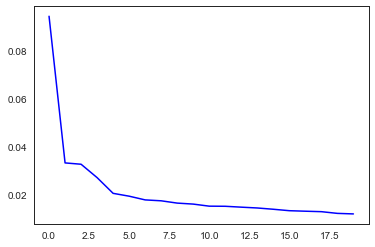

In [117]:
plt.plot(ev[0:20],'b')
#plt.plot(ev_L23m[0:20],'g')
#plt.plot(ev_L5[0:20],'y')

### SAMPLE SIZE SKEW??

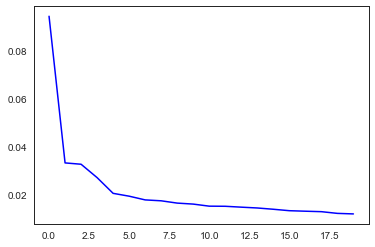

In [118]:
plt.plot(ev_all_lam[0:20],'b')
#plt.plot(ev_L23m[0:20],'g')
#plt.plot(ev_L5[0:20],'y')

### SAMPLE SIZE SKEW??

In [119]:
sum(ev[0:3])

0.1596868843755883

In [120]:
tm = int(np.shape(traj)[0]/2)

Text(0.5, 1.0, 'All Layers')

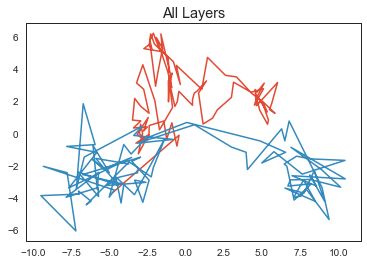

In [121]:
plt.figure()
plt.plot(traj[0][tm:],traj[1][tm:])
plt.plot(traj[0][:tm],traj[1][:tm])
plt.title('All Layers')

In [83]:
traj_all_lam = traj

Text(0.5, 0.92, 'All Layers')

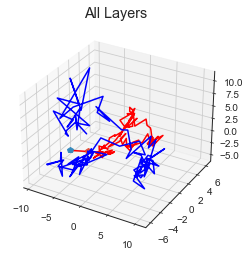

In [122]:
fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot3D(traj_all_lam[0][tm:],traj_all_lam[1][tm:],traj_all_lam[2][tm:],'r')
ax.plot3D(traj_all_lam[0][0],traj_all_lam[1][0],traj_all_lam[2][0],'p')
#ax.plot3D(traj[0][25],traj[1][25],traj[2][25],'p')
ax.plot3D(traj_all_lam[0][:tm],traj_all_lam[1][:tm],traj_all_lam[2][:tm],'b')
ax.plot3D(traj_all_lam[0][tm],traj_all_lam[1][tm],traj_all_lam[2][tm],'p')
#ax.plot3D(traj[0][75],traj[1][75],traj[2][75],'p')
plt.title('All Layers')

Text(0.5, 1.0, 'Layer 5')

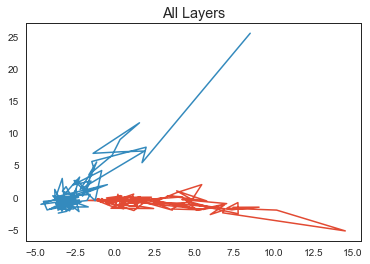

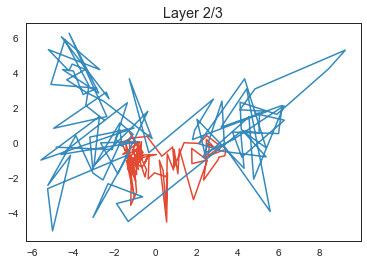

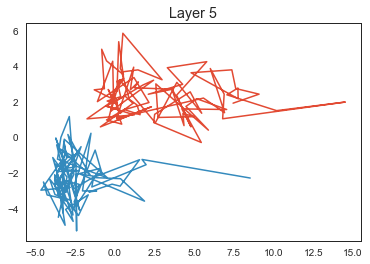

In [981]:
plt.figure()
plt.plot(traj_all_lam[0][tm:],traj_all_lam[1][tm:])
plt.plot(traj_all_lam[0][:tm],traj_all_lam[1][:tm])
plt.title('All Layers')

plt.figure()
plt.plot(traj_L23[0][tm:],traj_L23[1][tm:])
plt.plot(traj_L23[0][:tm],traj_L23[1][:tm])
plt.title('Layer 2/3')

plt.figure()
plt.plot(traj[0][tm:],traj_L5[1][tm:])
plt.plot(traj[0][:tm],traj_L5[1][:tm])
plt.title('Layer 5')

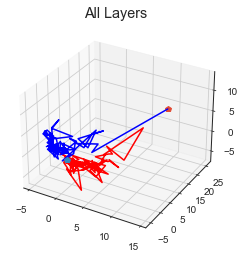

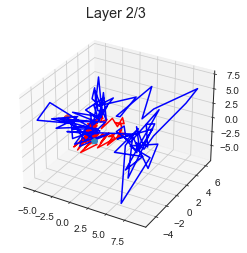

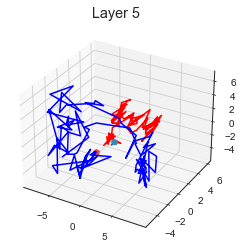

In [982]:
fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot3D(traj_all_lam[0][tm:],traj_all_lam[1][tm:],traj_all_lam[2][tm:],'r')
ax.plot3D(traj_all_lam[0][0],traj_all_lam[1][0],traj_all_lam[2][0],'p')
#ax.plot3D(traj[0][25],traj[1][25],traj[2][25],'p')
ax.plot3D(traj_all_lam[0][:tm],traj_all_lam[1][:tm],traj_all_lam[2][:tm],'b')
ax.plot3D(traj_all_lam[0][tm],traj_all_lam[1][tm],traj_all_lam[2][tm],'p')
#ax.plot3D(traj[0][75],traj[1][75],traj[2][75],'p')
plt.title('All Layers')

save_path = '/Users/kimberlygagnon/Documents/CU/Welle Lab/experiments/daileydata/figs/3d/' 
#plt.savefig(save_path+str('20_bot_3d')+'.png', format="PNG") #CHANGE MOUSE NUMBER BEFORE RUNNING





fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot3D(traj_L23[0][tm:],traj_L23[1][tm:],traj_L23[2][tm:],'r')
ax.plot3D(traj_L23[0][0],traj_L23[1][0],traj_L23[2][0],'p')
#ax.plot3D(traj[0][25],traj[1][25],traj[2][25],'p')
ax.plot3D(traj_L23[0][:tm],traj_L23[1][:tm],traj_L23[2][:tm],'b')
ax.plot3D(traj_L23[0][tm],traj_L23[1][tm],traj_L23[2][tm],'p')
#ax.plot3D(traj[0][75],traj[1][75],traj[2][75],'p')
plt.title('Layer 2/3')

save_path = '/Users/kimberlygagnon/Documents/CU/Welle Lab/experiments/daileydata/figs/3d/' 
#plt.savefig(save_path+str('20_bot_3d')+'.png', format="PNG") #CHANGE MOUSE NUMBER BEFORE RUNNING



fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot3D(traj_L5[0][tm:],traj_L5[1][tm:],traj_L5[2][tm:],'r')
ax.plot3D(traj_L5[0][0],traj_L5[1][0],traj_L5[2][0],'p')
#ax.plot3D(traj[0][25],traj[1][25],traj[2][25],'p')
ax.plot3D(traj_L5[0][:tm],traj_L5[1][:tm],traj_L5[2][:tm],'b')
ax.plot3D(traj_L5[0][tm],traj_L5[1][tm],traj_L5[2][tm],'p')
#ax.plot3D(traj[0][75],traj[1][75],traj[2][75],'p')
plt.title('Layer 5')

save_path = '/Users/kimberlygagnon/Documents/CU/Welle Lab/experiments/daileydata/figs/3d/' 
#plt.savefig(save_path+str('20_bot_3d')+'.png', format="PNG") #CHANGE MOUSE NUMBER BEFORE RUNNING

Text(0.5, 1.0, 'Layer 5 PC1')

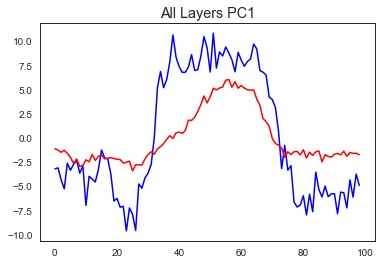

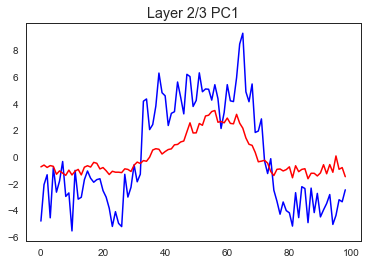

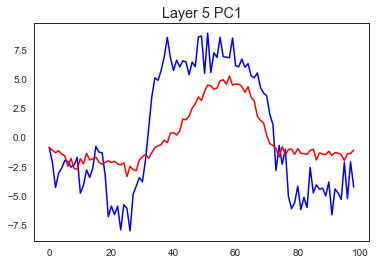

In [286]:
plt.figure()
plt.plot(traj_all_lam[0][:tm],'b')
plt.plot(traj_all_lam[0][tm:],'r')
plt.title('All Layers PC1')

plt.figure()
plt.plot(traj_L23[0][:tm],'b')
plt.plot(traj_L23[0][tm:],'r')
plt.title('Layer 2/3 PC1')

plt.figure()
plt.plot(traj_L5[0][:tm],'b')
plt.plot(traj_L5[0][tm:],'r')
plt.title('Layer 5 PC1')

Text(0.5, 1.0, 'Layer 5 PC2')

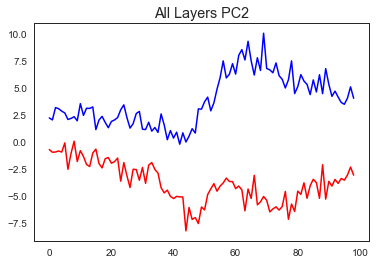

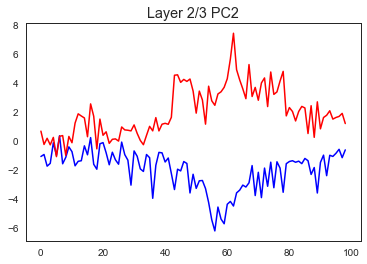

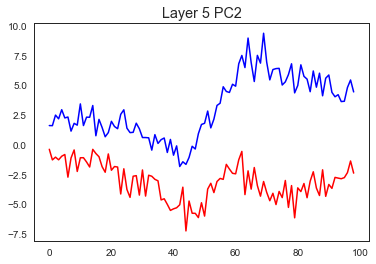

In [251]:
plt.figure()
plt.plot(traj_all_lam[1][:tm],'b')
plt.plot(traj_all_lam[1][tm:],'r')
plt.title('All Layers PC2')

plt.figure()
plt.plot(traj_L23[1][:tm],'b')
plt.plot(traj_L23[1][tm:],'r')
plt.title('Layer 2/3 PC2')

plt.figure()
plt.plot(traj_L5[1][:tm],'b')
plt.plot(traj_L5[1][tm:],'r')
plt.title('Layer 5 PC2')

Text(0.5, 1.0, 'Layer 5 PC3')

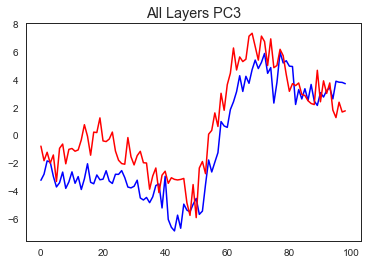

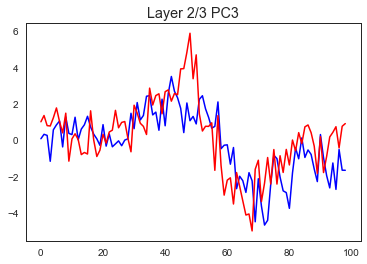

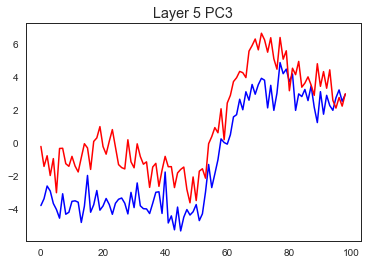

In [252]:
plt.figure()
plt.plot(traj_all_lam[2][:tm],'b')
plt.plot(traj_all_lam[2][tm:],'r')
plt.title('All Layers PC3')

plt.figure()
plt.plot(traj_L23[2][:tm],'b')
plt.plot(traj_L23[2][tm:],'r')
plt.title('Layer 2/3 PC3')

plt.figure()
plt.plot(traj_L5[2][:tm],'b')
plt.plot(traj_L5[2][tm:],'r')
plt.title('Layer 5 PC3')

Text(0.5, 1.0, 'Layer 5 PC4')

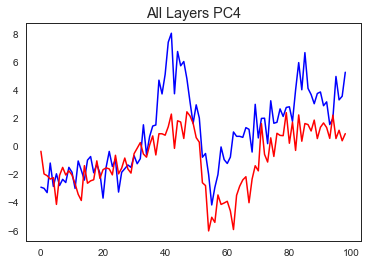

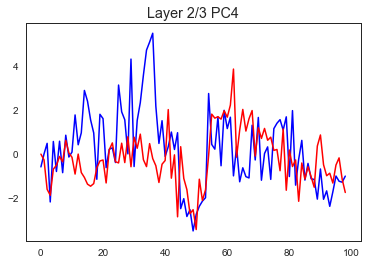

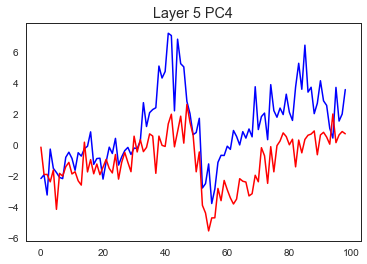

In [208]:
plt.figure()
plt.plot(traj_all_lam[3][:tm],'b')
plt.plot(traj_all_lam[3][tm:],'r')
plt.title('All Layers PC4')

plt.figure()
plt.plot(traj_L23[3][:tm],'b')
plt.plot(traj_L23[3][tm:],'r')
plt.title('Layer 2/3 PC4')

plt.figure()
plt.plot(traj_L5[3][:tm],'b')
plt.plot(traj_L5[3][tm:],'r')
plt.title('Layer 5 PC4')

Text(0.5, 1.0, 'Layer 5 PC5')

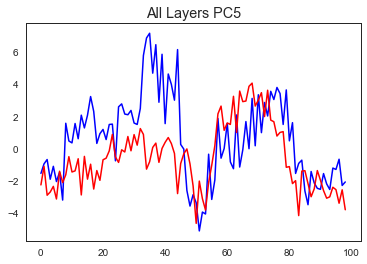

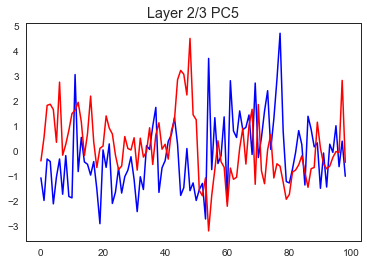

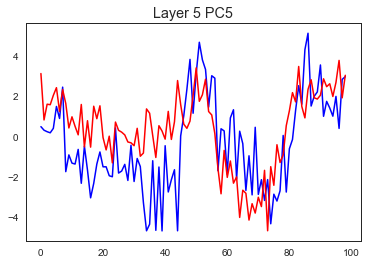

In [209]:
plt.figure()
plt.plot(traj_all_lam[4][:tm],'b')
plt.plot(traj_all_lam[4][tm:],'r')
plt.title('All Layers PC5')

plt.figure()
plt.plot(traj_L23[4][:tm],'b')
plt.plot(traj_L23[4][tm:],'r')
plt.title('Layer 2/3 PC5')

plt.figure()
plt.plot(traj_L5[4][:tm],'b')
plt.plot(traj_L5[4][tm:],'r')
plt.title('Layer 5 PC5')

In [52]:
dfr18 = df_reaches

In [107]:
dfr = df_reaches[df_reaches.behaviors=='success'].reset_index()

In [109]:
dfr = dfr.drop('level_0',axis=1)

In [110]:
dfr

,reachInit,reachMax,reachEnd,stim,end_category,behaviors,rMax_t
0,55226,55251,55268,0,noPellet,success,371.715900
1,115547,115592,115628,0,noPellet,success,773.996333
2,133946,133980,134006,0,noPellet,success,896.595333
3,136310,136358,136376,0,noPellet,success,912.450233
4,140670,140709,140731,0,noPellet,success,941.459833
5,148526,148567,148606,0,noPellet,success,993.851767
6,148878,148916,148943,0,noPellet,success,996.178667
7,154546,154571,154614,0,noPellet,success,1033.875800
8,404607,404632,404668,0,noPellet,success,2701.110000
9,406189,406215,406290,0,noPellet,success,2711.664400


In [59]:
dfr_ = dfr.drop(0).reset_index()

In [628]:
dfr_0 = dfr.drop(1).reset_index()

In [21]:

# look at sequence
df_reaches = dfr_
df
start= -2
end = 2

edgest=np.arange(start,end,0.020)
num_binst=(edgest.shape[0]) #number of bins 
hmap=np.zeros((shape(df)[0],num_binst))
#hmap_rollave=np.zeros((shape(df)[0],num_bins))
byreach = []
rollave = []
maxfr_ts = []
minfr_ts = []
maxfrs = []
normedbins = []
normedbins_roll = []
inds = []

for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max

    hmap=np.zeros((shape(df)[0],num_binst))
    byreach = []
    rollave = []
    maxfr_ts = []
    minfr_ts = []
    maxfrs = []
    normedbins = []
    smooths = []
    indices = []
    aveup = []
    avedown = []
    avesuccup = []
    avesuccdown = []

    a = tmax+start
    b = tmax+end

    trial_outcome = j, df_reaches.behaviors[j]

    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        binsize = 0.020
        rd = np.array(t[(t >= a) & (t <= b)]) #find if that unit spiked within designated timeframes around reachmax
        edges=np.arange(a,b,binsize) #designated bins around this iteration of reachmax
        num_bins=edges.shape[0]-1 #number of bins 
        hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
        #hmap[i,:] = hist
        byreach.append(hist)

        ave_max_t = df.peakup[i]
        aveup.append(ave_max_t)
        ave_min_t = df.peakdown[i]
        avedown.append(ave_min_t)

        if sum(hist)>0:
            normbins = (hist-min(hist))/max(hist) #per dailey
            normedbins.append(normbins)
        else:
            normedbins.append(None)


        binsize_ = 0.001
        edges_=np.arange(a,b,binsize_) #designated bins around this iteration of reachmax
        num_bins_=edges_.shape[0]-1 #number of bins 
        unit=np.histogram(rd,edges_)[0] #bin spikes into timeframe
        unit_ser = pd.Series(unit)        
        rolave_unit = unit_ser.rolling(100).sum() #takes sum of 100bins, shifts 1bin .. 100 bins binned at 1 ms = 100ms summed bins
        rolave_unit = np.array(rolave_unit.dropna())
        maxfr = np.max(rolave_unit)/.1
        maxfr_t = edges_[np.argmax(rolave_unit)]-tmax
        minfr_t = edges_[np.argmin(rolave_unit)]-tmax
        #hmap_rollave[i,:] = unit
        rollave.append(unit)
        maxfrs.append(maxfr)
        maxfr_ts.append(maxfr_t)
        minfr_ts.append(minfr_t)

    inds.append(indices)

    df_temp = pd.DataFrame(data=minfr_ts,columns=['tmin'])
    df_temp['tmax'] = maxfr_ts
    df_temp['bins'] = normedbins
    df_temp['prev_tmax'] = indix
    #df_temp['aveup'] = aveup


#create temp dataframe and sort values by max, plot heatmap
    df_s_ = df_temp.sort_values(by=['tmax'])
    df_bins_ = df_s_.bins
    df_heatmap_ = list(filter(any, df_bins_))
    fig, ax = plt.subplots(figsize=(20, 10))
    sns.heatmap(df_heatmap_)
    plt.title(trial_outcome)
    plt.gca().axvline(150,c='b',ls='-')
    #save_path1 = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/individualtrial/'
    #fig.savefig(save_path1+str(trial_outcome)+'peak'+'.png')




AttributeError: 'DataFrame' object has no attribute 'peakup'

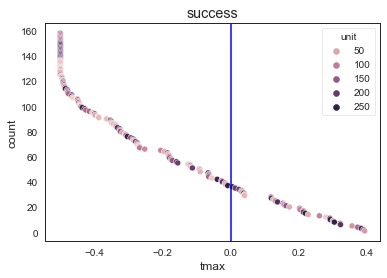

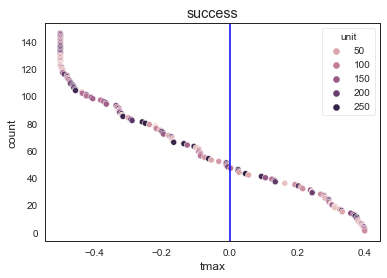

In [872]:
df_reaches = dfr

start = -.5
end = .5
binsize=0.020

edgest=np.arange(start,end,0.020)
num_binst=(edgest.shape[0]) #number of bins 
hmap=np.zeros((shape(df)[0],num_binst))
byreach = []
rollave = []
maxfr_ts = []
minfr_ts = []
maxfrs = []
normedbins = []
normedbins_roll = []
inds = []
ts = []


for j,tmax in enumerate(df_reaches.rMax_t): #compare that unit's spike times to each reach max

    byreach = []
    maxfr_ts = []
    minfr_ts = []
    maxfrs = []
    normedbins = []
    indix = []
    mxs = []
    types = []
    cls = []

    a = tmax+start
    b = tmax+end
    behav = df_reaches.behaviors[j]
    #fig, ax = plt.subplots(figsize=(20, 10))
    plt.title(behav)

    for i,times in enumerate(df.times): #for each unit 
        t = np.array(times) #for reach unit create an array of that unit's spike times
        binsize = 0.020
        rd = np.array(t[(t >= a) & (t <= b)]) #find if that unit spiked within designated timeframes around reachmax
        edges=np.arange(a,b,binsize) #designated bins around this iteration of reachmax
        num_bins=edges.shape[0]-1 #number of bins 
        hist=np.histogram(rd,edges)[0] #bin spikes into timeframe
        byreach.append(hist)
        i = df.index[i]
        tp = df.waveform_class[i]
        types.append(tp)

        if sum(hist)>0:
            normbins = (hist-min(hist))/max(hist) #per dailey
            normedbins.append(normbins)
            #seq.append(normedbins)
           # x = i #unit number
            #indix.append(x)
        else:
            normedbins.append(None)

        binsize_ = 0.001
        edges_=np.arange(a,b,binsize_) #designated bins around this iteration of reachmax
        num_bins_=edges_.shape[0]-1 #number of bins 
        unit=np.histogram(rd,edges_)[0] #bin spikes into timeframe
        unit_ser = pd.Series(unit)        
        rolave_unit = unit_ser.rolling(100).sum() #takes sum of 100bins, shifts 1bin .. 100 bins binned at 1 ms = 100ms summed bins
        rolave_unit = np.array(rolave_unit.dropna())
        maxfr = np.max(rolave_unit)/.1
        maxfr_t = edges_[np.argmax(rolave_unit)]-tmax
        minfr_t = edges_[np.argmin(rolave_unit)]-tmax
        #hmap_rollave[i,:] = unit
        rollave.append(unit)
        maxfrs.append(maxfr)
        maxfr_ts.append(maxfr_t)
        minfr_ts.append(minfr_t)

    df_temp = pd.DataFrame(data=minfr_ts,columns=['tmin'])
    df_temp['bins'] = normedbins
    df_temp['tmax'] = maxfr_ts
    df_temp['unit_class'] = types

    df_s = df_temp.sort_values(by=['tmax'])

    for n,gr in enumerate(df_s.bins):
        if gr is not None:
            x = df_s.index[n]
            indix.append(x)
            mx = df_s.tmax[x]
            mxs.append(mx)
            cl = df_temp.unit_class[x]
            cls.append(cl)
        else:
            []
    inds.append(indix)

    dff = np.diff(mxs)

    count = arange(shape(indix)[0],0,-1)
    df_ind = pd.DataFrame(data=count,columns=['count'])
    df_ind['unit'] = indix
    df_ind['tmax'] = mxs
    df_ind['unit_class'] = cls
    
    sns.scatterplot(x='tmax',y='count',data=df_ind,hue='unit',legend=True)
    plt.gca().axvline(0,c='b',ls='-')
    plt.show()
    save_path = '/Users/kimberlygagnon/Documents/CU/WelleLab/experiments/daileydata/bytrial/temporary/'
    fig.savefig(save_path+str(j)+str(behav))

In [894]:
df = df_18

In [927]:
dfr_20 = df_reaches

In [926]:
df = df_20

In [928]:
dfr_f = df_reaches[df_reaches.behaviors!='success']
dfr_f = dfr_f.reset_index()

In [929]:
dfr_f = dfr_f.drop('level_0',axis=1)
dfr_f = dfr_f.drop('index',axis=1)

In [914]:
mod_up, mod_down, maxfr_ts, minfr_ts, a = movement_mod(df,dfr_f,startb = -4.0,endb = -3.0,starte = -3,ende = 3,binsize=0.001)


In [915]:
df['tmax'] = maxfr_ts
df['tmin'] = minfr_ts

In [724]:
df=df.reset_index()

In [725]:
df = df.drop('index',axis=1)

In [714]:
df = df.drop('index',axis=1)

In [814]:
count = df.index

In [815]:
count

Int64Index([144, 146, 147, 148, 149, 150, 151, 152, 153, 154,
            ...
            217, 218, 219, 220, 221, 222, 223, 224, 225, 226],
           dtype='int64', length=236)

In [935]:
count = arange(236,0,-1)

In [936]:
df_s['count'] = count

In [757]:
indix = df.index

In [932]:
df_s = df.sort_values(by=['peakup_s'])

In [933]:
df_s = df_s.reset_index()

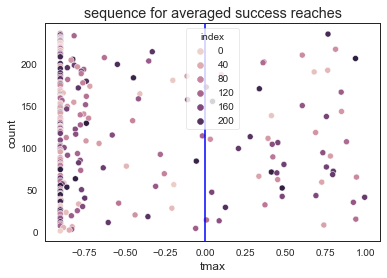

In [938]:
sns.scatterplot(x='tmax',y='count',data=df_s,hue='index')
plt.title('sequence for averaged success reaches')
plt.gca().axvline(0,c='b',ls='-')
